James Weaver Project 2 knn classifer

In [775]:
############################################
########## My common Libraries #############
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import statsmodels.api as sm
import sklearn
import random as r
###########################################
###########################################

############################################
##########  ignore warnings ################
import warnings
warnings.filterwarnings('ignore')
###########################################
###########################################

random_number = 58097

# 1 Collect Data

In [251]:
data = pd.read_csv('nba_stats_2003_to_20200.csv') # Upload Data
#data.drop(['Unnamed: 29','Unnamed: 30'],axis=1,inplace=True) # Delete the last 2 cols because they are blank
df = data.copy()
df.head()

,Season,TEAM,Conference Standings,All Stars,MVP,Playoffs Games Won,GP,W,L,WIN%,...,AST.1,OREB%,DREB%,REB%,TOV%,EFG%,TS%,PACE,PIE,POSS
0,2002-2003,Dallas Mavericks,3.0,2,NaN,10.0,82,60,22,0.732,...,17.3,27.7,67.7,47.8,12.3,49.8,54.3,93.75,54.6,"7,726"
1,2002-2003,San Antonio Spurs,1.0,1,1.0,16.0,82,60,22,0.732,...,15.9,31.1,68.7,50.8,17.1,49.7,54.1,91.46,54.9,"7,558"
2,2002-2003,Sacramento Kings,2.0,2,NaN,7.0,82,59,23,0.720,...,18.3,28.9,67.8,49.3,14.9,49.9,53.5,96.63,55.1,"7,987"
3,2002-2003,Minnesota Timberwolves,4.0,1,NaN,2.0,82,51,31,0.622,...,19.0,31.0,69.5,50.8,14.6,48.8,52.8,93.08,52.9,"7,681"
4,2002-2003,Detroit Pistons,1.0,1,NaN,8.0,82,50,32,0.610,...,16.2,29.4,70.7,49.9,15.1,47.3,52.3,88.26,52.5,"7,318"


### columns

In [774]:
df.columns

Index(['Season', 'TEAM ', 'Conference Standings', 'All Stars', 'MVP',
       'Playoffs Games Won', 'GP', 'W', 'L', 'WIN%', 'MIN', 'PTS', 'FGM',
       'FGA', 'FG%', '3PM', '3PA', '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB',
       'REB', 'AST', 'TOV', 'STL', 'BLK', 'BLKA', 'PF', 'PFD', '+/-', 'MIN.1',
       'OFFRTG', 'DEFRTG', 'NETRTG', 'AST%', 'AST/TO Ratio', 'AST.1', 'OREB%',
       'DREB%', 'REB%', 'TOV%', 'EFG%', 'TS%', 'PACE', 'PIE', 'POSS'],
      dtype='object')

# 2 Variable Analysis

### The type of variables in the dataset

In [253]:
df.dtypes

Season                   object
TEAM                     object
Conference Standings    float64
All Stars                 int64
MVP                     float64
Playoffs Games Won      float64
GP                        int64
W                         int64
L                         int64
WIN%                    float64
MIN                     float64
PTS                     float64
FGM                     float64
FGA                     float64
FG%                     float64
3PM                     float64
3PA                     float64
3P%                     float64
FTM                     float64
FTA                     float64
FT%                     float64
OREB                    float64
DREB                    float64
REB                     float64
AST                     float64
TOV                     float64
STL                     float64
BLK                     float64
BLKA                    float64
PF                      float64
PFD                     float64
+/-     

### The data contain floats, integers, and strings(object)

In [776]:
df.describe()

,Conference Standings,All Stars,MVP,Playoffs Games Won,GP,W,L,WIN%,MIN,PTS,...,AST/TO Ratio,AST.1,OREB%,DREB%,REB%,TOV%,EFG%,TS%,PACE,PIE
count,288.000000,538.000000,18.0,288.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,...,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000,538.000000
mean,4.500000,0.860595,1.0,5.236111,80.468401,40.234201,40.234201,0.499717,48.357993,100.813197,...,1.532862,16.806506,29.554461,70.421933,50.000372,15.177695,49.904089,54.015799,94.514981,49.990706
std,2.295276,0.870096,0.0,4.724443,4.451259,12.425457,12.318287,0.151250,0.178816,6.395727,...,0.192925,1.169401,2.768442,2.244049,1.350936,1.259402,2.339600,2.110458,3.647847,3.308866
min,1.000000,0.000000,1.0,0.000000,64.000000,7.000000,9.000000,0.106000,48.000000,84.200000,...,1.010000,14.100000,21.600000,65.000000,45.300000,11.900000,42.800000,46.900000,87.390000,41.100000
25%,2.750000,0.000000,1.0,2.000000,82.000000,32.000000,31.000000,0.390000,48.200000,96.325000,...,1.400000,16.000000,27.600000,68.800000,49.200000,14.300000,48.200000,52.500000,91.822500,47.800000
50%,4.500000,1.000000,1.0,3.500000,82.000000,41.000000,40.000000,0.512000,48.400000,99.850000,...,1.520000,16.800000,29.700000,70.300000,50.000000,15.100000,49.750000,53.900000,93.945000,50.100000
75%,6.250000,1.000000,1.0,7.250000,82.000000,50.000000,49.000000,0.610000,48.500000,104.575000,...,1.660000,17.500000,31.400000,71.900000,50.900000,16.000000,51.500000,55.400000,96.825000,52.475000
max,8.000000,4.000000,1.0,16.000000,82.000000,73.000000,72.000000,0.890000,49.000000,118.700000,...,2.120000,21.200000,37.300000,77.500000,54.100000,20.000000,56.900000,60.300000,105.510000,58.100000


### Inspection the variable values

In [255]:
for var in df.columns:
    print(var, df[var].unique()[0:20], '\n') 

Season ['2002-2003' '2003-2004' '2004-2005' '2005-2006' '2006-2007' '2007-2008'
 '2008-2009' '2009-2010' '2010-2011' '2011-2012' '2012-2013' '2013-2014'
 '2014-2015' '2015-2016' '2016-2017' '2017-2018' '2018-2019' '2019-2020'] 

TEAM  ['Dallas Mavericks' 'San Antonio Spurs' 'Sacramento Kings'
 'Minnesota Timberwolves' 'Detroit Pistons' 'Los Angeles Lakers'
 'Portland Trail Blazers' 'New Jersey Nets' 'Indiana Pacers'
 'Philadelphia 76ers' 'New Orleans Hornets' 'Utah Jazz' 'Boston Celtics'
 'Phoenix Suns' 'Houston Rockets' 'Milwaukee Bucks' 'Orlando Magic'
 'Seattle SuperSonics' 'Golden State Warriors' 'New York Knicks'] 

Conference Standings [ 3.  1.  2.  4.  5.  6.  7.  8. nan] 

All Stars [2 1 0 3 4] 

MVP [nan  1.] 

Playoffs Games Won [10. 16.  7.  2.  8.  6.  3. 14.  1.  4. nan 13.  0.  9. 11. 15.  5. 12.] 

GP [82 66 81 72 71 74 73 64 65 75 67] 

W [60 59 51 50 49 48 47 44 43 42 40 38 37 35 30 28 27 25 24 17] 

L [22 23 31 32 33 34 35 38 39 40 42 44 45 47 52 54 55 57 58 65] 

WIN

It is [0:20] because it will display the first 20 unique variables to see what data we are dealing with.

### List of the type or variables

In [797]:
###### numerical: discrete vs continuous ##### Note that target variable is Playoffs Games Won df[var].dtype=='int64'
target_name = 'Playoffs Games Won'

###### numerical: discrete ###### 
# discrete = [var for var in df.columns if df[var].dtype!='O' and var!=target_name and df[var].nunique()<=10]
discrete1 = [var for var in df.columns if df[var].dtype!='O' and var!=target_name and df[var].dtype=='int64']
discrete2 = [var for var in df.columns if df[var].dtype!='O' and var!=target_name and df[var].nunique()<=10]
discrete = discrete1 + discrete2
'''
In this example we we will catorgize the variables as discrete if any of the variables is not a string
and not the target variable 
and contain less than 10 unique values
'''
############################################################################################################################

###### numerical: continuous ######
continuous = [var for var in df.columns if df[var].dtype!='O' and var!=target_name and var not in discrete]
'''
In this example we will catorgize the variables as continuous if any of the variables is not a string
and varible is not the target variable
and variable is not the discrtete varible
'''
#############################################################################################################################

###### mixed varibles ######

mixed = ['Season']
'''
from the previous tabs, it appeears that Season are mixed variables because they contain numbers, letters, and symbols.
'''
#############################################################################################################################

# categorical
categorical = [var for var in df.columns if df[var].dtype=='O' and var not in mixed]
'''
any string and not a mixed varibe will be label as categorical
'''
##############################################################################################################################

print(f'There are {len(discrete)} discrete variables')
print(f'There are {len(continuous)} continuous variables')
print(f'There are {len(categorical)} categorical variables')
print(f'There are {len(mixed)} mixed variables')
print(f'\nDiscrete variables:{discrete}\n\nContinuous variables:{continuous}\n\nCategorical variables:{categorical}\n\nMixed variables:{mixed}')

There are 8 discrete variables
There are 37 continuous variables
There are 2 categorical variables
There are 1 mixed variables

Discrete variables:['All Stars', 'GP', 'W', 'L', 'MIN.1', 'Conference Standings', 'All Stars', 'MVP']

Continuous variables:['WIN%', 'MIN', 'PTS', 'FGM', 'FGA', 'FG%', '3PM', '3PA', '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB', 'REB', 'AST', 'TOV', 'STL', 'BLK', 'BLKA', 'PF', 'PFD', '+/-', 'OFFRTG', 'DEFRTG', 'NETRTG', 'AST%', 'AST/TO Ratio', 'AST.1', 'OREB%', 'DREB%', 'REB%', 'TOV%', 'EFG%', 'TS%', 'PACE', 'PIE']

Categorical variables:['TEAM ', 'POSS']

Mixed variables:['Season']


### The cardinality of the categorical mixed variables

In [807]:
'''
the cardinality for Team and season is too high and needs investigation.
'''
df[categorical+mixed].nunique()

TEAM       36
POSS      442
Season     18
dtype: int64

### Boxplot of the continous variables

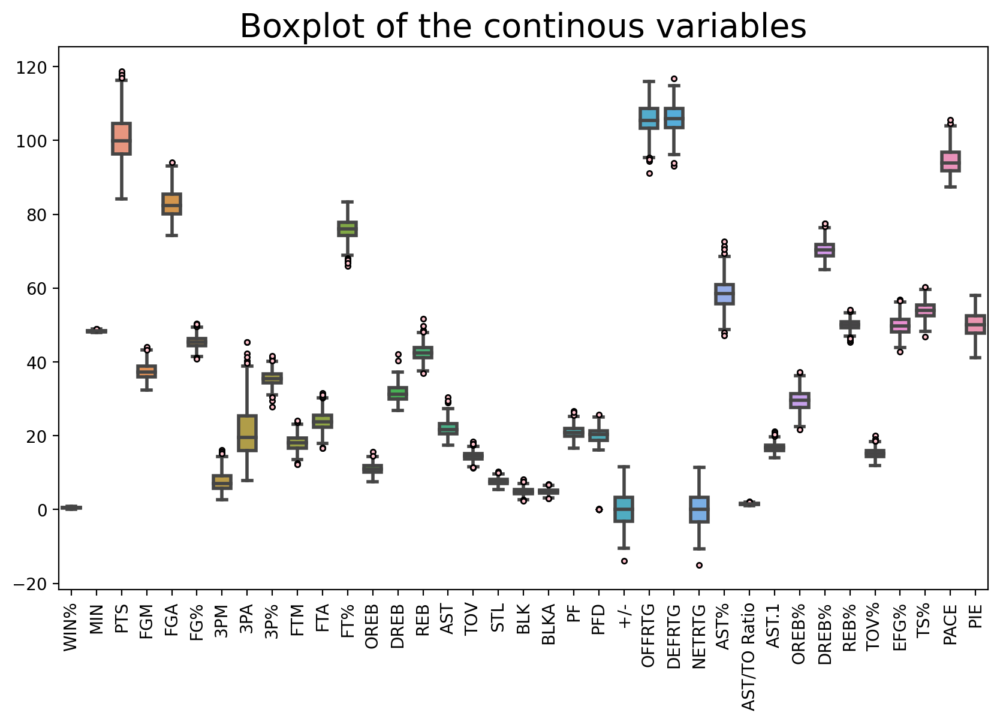

In [817]:
# dic for outlier style 
flierprops_ = dict(marker = 'o',
                   markerfacecolor='pink',
                   markersize=3,
                   linestyle='none',
                   markeredgecolor='black') 


fig, axes = plt.subplots(figsize = (10,6),dpi=200)

### set graph settings  ###
axes.set_title('Boxplot of the continous variables', # Title of hist
               fontsize = 20, # Font size of title
               color ='black') # Color of title

# boxplot setings 
sns.boxplot(data=df[continuous], # import data
            linewidth=2, # line width
            width=.7,
            flierprops=flierprops_) # outliers style

axes.set_xticklabels(labels = continuous, # name of each tick marks
                             rotation=90, # rotation of each tick mark
                             fontsize = 10, #font size of each tick mark
                             ha= 'center', # hor alig to the right
                             color = 'black');  # color of x-tick labels

# 3 Feature Engineering

## 3.1 Null Analysis

### How many observerations are missing for each feature?

In [821]:
df.isnull().sum()

Season                    0
TEAM                      0
Conference Standings    250
All Stars                 0
MVP                     520
Playoffs Games Won      250
GP                        0
W                         0
L                         0
WIN%                      0
MIN                       0
PTS                       0
FGM                       0
FGA                       0
FG%                       0
3PM                       0
3PA                       0
3P%                       0
FTM                       0
FTA                       0
FT%                       0
OREB                      0
DREB                      0
REB                       0
AST                       0
TOV                       0
STL                       0
BLK                       0
BLKA                      0
PF                        0
PFD                       0
+/-                       0
MIN.1                     0
OFFRTG                    0
DEFRTG                    0
NETRTG              

Conference Standings, MVP, and Playoffs Games Won contain missing values.

### How many observerations are missing for each feature? (as a percentage)

In [823]:
df.isnull().mean() * 100 

Season                   0.000000
TEAM                     0.000000
Conference Standings    46.468401
All Stars                0.000000
MVP                     96.654275
Playoffs Games Won      46.468401
GP                       0.000000
W                        0.000000
L                        0.000000
WIN%                     0.000000
MIN                      0.000000
PTS                      0.000000
FGM                      0.000000
FGA                      0.000000
FG%                      0.000000
3PM                      0.000000
3PA                      0.000000
3P%                      0.000000
FTM                      0.000000
FTA                      0.000000
FT%                      0.000000
OREB                     0.000000
DREB                     0.000000
REB                      0.000000
AST                      0.000000
TOV                      0.000000
STL                      0.000000
BLK                      0.000000
BLKA                     0.000000
PF            

In [ ]:
### The rows of missing observations for the Playoffs Games Won Feature

### The rows of missing observations for the Playoffs Games Won Column

In [261]:
df[df['Playoffs Games Won'].isnull()].head()C

,Season,TEAM,Conference Standings,All Stars,MVP,Playoffs Games Won,GP,W,L,WIN%,...,AST.1,OREB%,DREB%,REB%,TOV%,EFG%,TS%,PACE,PIE,POSS
14,2002-2003,Houston Rockets,NaN,2,NaN,NaN,82,43,39,0.524,...,14.7,33.1,69.8,51.8,17.0,47.4,52.2,90.36,51.1,"7,508"
17,2002-2003,Seattle SuperSonics,NaN,1,NaN,NaN,82,40,42,0.488,...,17.2,31.4,68.8,49.7,14.7,47.2,51.2,89.17,50.2,"7,379"
18,2002-2003,Golden State Warriors,NaN,0,NaN,NaN,82,38,44,0.463,...,15.4,37.1,66.3,51.8,16.4,47.2,52.6,95.88,49.2,"7,897"
19,2002-2003,New York Knicks,NaN,0,NaN,NaN,82,37,45,0.451,...,17.2,28.0,68.9,48.0,15.1,48.6,52.8,92.06,47.4,"7,611"
20,2002-2003,Washington Wizards,NaN,1,NaN,NaN,82,37,45,0.451,...,15.9,30.5,68.6,49.6,14.8,46.0,51.3,89.46,49.8,"7,390"


The Playoffs Games Won have missing values because these observations(teams) did not make it to the playoffs.

46.47% of the Playoffs Games Won column contain null values.

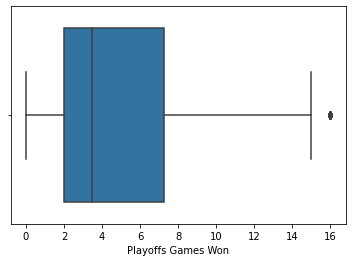

In [262]:
sns.boxplot('Playoffs Games Won',data=df);

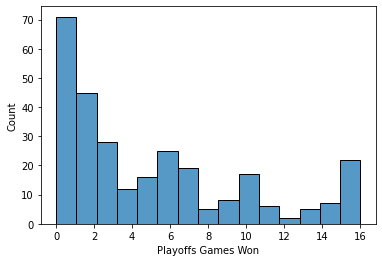

In [263]:
sns.histplot(df['Playoffs Games Won'],bins=15);

In [264]:
df1 = data.copy()
df1.tail(20)

,Season,TEAM,Conference Standings,All Stars,MVP,Playoffs Games Won,GP,W,L,WIN%,...,AST.1,OREB%,DREB%,REB%,TOV%,EFG%,TS%,PACE,PIE,POSS
518,2019-2020,New York Knicks,NaN,0,NaN,NaN,66,21,45,0.318,...,16.0,30.0,74.2,51.3,14.3,50.1,53.1,99.11,46.1,"6,594"
519,2019-2020,New Orleans Pelicans,NaN,1,NaN,NaN,72,30,42,0.417,...,18.4,28.7,72.9,50.8,15.6,53.9,56.8,103.89,49.5,"7,548"
520,2019-2020,Minnesota Timberwolves,NaN,0,NaN,NaN,64,19,45,0.297,...,16.7,26.4,73.1,48.8,14.6,51.4,55.1,103.94,47.2,"6,736"
521,2019-2020,Milwaukee Bucks,1.0,2,1.0,5.0,73,56,17,0.767,...,18.0,24.1,77.5,52.4,14.2,55.2,58.3,105.51,56.2,"7,739"
522,2019-2020,Miami Heat,5.0,2,NaN,14.0,73,44,29,0.603,...,18.8,25.7,75.3,51.2,14.9,54.7,58.7,98.70,52.5,"7,306"
523,2019-2020,Memphis Grizzlies,NaN,0,NaN,NaN,73,34,39,0.466,...,18.7,27.1,73.3,50.6,14.7,52.8,56.1,103.31,50.7,"7,562"
524,2019-2020,Los Angeles Lakers,1.0,2,NaN,16.0,71,52,19,0.732,...,18.0,28.3,73.7,51.2,14.9,54.2,57.3,101.20,53.9,"7,211"
525,2019-2020,LA Clippers,2.0,1,NaN,7.0,72,49,23,0.681,...,16.9,27.8,73.7,51.5,14.2,53.5,57.7,102.16,53.2,"7,396"
526,2019-2020,Indiana Pacers,4.0,1,NaN,0.0,73,45,28,0.616,...,18.9,24.3,71.8,48.7,13.2,53.4,56.5,99.41,52.0,"7,299"
527,2019-2020,Houston Rockets,4.0,2,NaN,5.0,72,44,28,0.611,...,15.5,24.9,71.3,48.0,14.0,53.7,57.8,104.04,49.4,"7,539"


In [265]:
df1 = data.copy()
step = 0
for i in df1['Playoffs Games Won']:
    if isinstance(i,float):
        if i < 4:
            df1['Playoffs Games Won'][step] = '1st Round'
            step = step + 1
        elif i < 8:
            df1['Playoffs Games Won'][step] = 'Conference Semifinals'
            step = step + 1
        elif i < 12:
            df1['Playoffs Games Won'][step] = 'Conference Finals'
            step = step + 1
        elif i < 16:
            df1['Playoffs Games Won'][step] = 'NBA Finals'
            step = step + 1
        elif i == 16:
            df1['Playoffs Games Won'][step] = 'NBA Champion'
            step = step + 1
        else:
            df1['Playoffs Games Won'][step] = 'No Playoffs'
            step = step + 1
        
        
df1.tail(20)        

,Season,TEAM,Conference Standings,All Stars,MVP,Playoffs Games Won,GP,W,L,WIN%,...,AST.1,OREB%,DREB%,REB%,TOV%,EFG%,TS%,PACE,PIE,POSS
518,2019-2020,New York Knicks,NaN,0,NaN,No Playoffs,66,21,45,0.318,...,16.0,30.0,74.2,51.3,14.3,50.1,53.1,99.11,46.1,"6,594"
519,2019-2020,New Orleans Pelicans,NaN,1,NaN,No Playoffs,72,30,42,0.417,...,18.4,28.7,72.9,50.8,15.6,53.9,56.8,103.89,49.5,"7,548"
520,2019-2020,Minnesota Timberwolves,NaN,0,NaN,No Playoffs,64,19,45,0.297,...,16.7,26.4,73.1,48.8,14.6,51.4,55.1,103.94,47.2,"6,736"
521,2019-2020,Milwaukee Bucks,1.0,2,1.0,Conference Semifinals,73,56,17,0.767,...,18.0,24.1,77.5,52.4,14.2,55.2,58.3,105.51,56.2,"7,739"
522,2019-2020,Miami Heat,5.0,2,NaN,NBA Finals,73,44,29,0.603,...,18.8,25.7,75.3,51.2,14.9,54.7,58.7,98.70,52.5,"7,306"
523,2019-2020,Memphis Grizzlies,NaN,0,NaN,No Playoffs,73,34,39,0.466,...,18.7,27.1,73.3,50.6,14.7,52.8,56.1,103.31,50.7,"7,562"
524,2019-2020,Los Angeles Lakers,1.0,2,NaN,NBA Champion,71,52,19,0.732,...,18.0,28.3,73.7,51.2,14.9,54.2,57.3,101.20,53.9,"7,211"
525,2019-2020,LA Clippers,2.0,1,NaN,Conference Semifinals,72,49,23,0.681,...,16.9,27.8,73.7,51.5,14.2,53.5,57.7,102.16,53.2,"7,396"
526,2019-2020,Indiana Pacers,4.0,1,NaN,1st Round,73,45,28,0.616,...,18.9,24.3,71.8,48.7,13.2,53.4,56.5,99.41,52.0,"7,299"
527,2019-2020,Houston Rockets,4.0,2,NaN,Conference Semifinals,72,44,28,0.611,...,15.5,24.9,71.3,48.0,14.0,53.7,57.8,104.04,49.4,"7,539"


## Converting the catogorical and mixed features and turn them into numbers

In [266]:
df1[categorical+mixed].head()

,TEAM,POSS,Season
0,Dallas Mavericks,"7,726",2002-2003
1,San Antonio Spurs,"7,558",2002-2003
2,Sacramento Kings,"7,987",2002-2003
3,Minnesota Timberwolves,"7,681",2002-2003
4,Detroit Pistons,"7,318",2002-2003


In [267]:
# Lets check cardality 
df1[categorical+mixed].nunique()

TEAM       36
POSS      442
Season     18
dtype: int64

In [268]:
df1['TEAM '].value_counts()

Sacramento Kings                     18
Detroit Pistons                      18
Portland Trail Blazers               18
New York Knicks                      18
Cleveland Cavaliers                  18
Los Angeles Lakers                   18
Indiana Pacers                       18
San Antonio Spurs                    18
Miami Heat                           18
Milwaukee Bucks                      18
Boston Celtics                       18
Atlanta Hawks                        18
Philadelphia 76ers                   18
Orlando Magic                        18
Houston Rockets                      18
Golden State Warriors                18
Memphis Grizzlies                    18
Chicago Bulls                        18
Phoenix Suns                         18
Utah Jazz                            18
Toronto Raptors                      18
Washington Wizards                   18
Dallas Mavericks                     18
Minnesota Timberwolves               18
Denver Nuggets                       18


In [269]:
df1['Season'].value_counts()

2013-2014    30
2005-2006    30
2004-2005    30
2014-2015    30
2007-2008    30
2006-2007    30
2019-2020    30
2011-2012    30
2012-2013    30
2017-2018    30
2015-2016    30
2008-2009    30
2016-2017    30
2009-2010    30
2010-2011    30
2018-2019    30
2002-2003    29
2003-2004    29
Name: Season, dtype: int64

In [270]:
df1['POSS'].value_counts()

7,379    4
7,816    3
7,428    3
7,696    3
7,892    3
        ..
7,628    1
6,140    1
7,984    1
8,232    1
7,530    1
Name: POSS, Length: 442, dtype: int64

Team and Season are irrevanlt features and will not use them for the analysis 

In [271]:
df1.isnull().sum()

Season                    0
TEAM                      0
Conference Standings    250
All Stars                 0
MVP                     520
Playoffs Games Won        0
GP                        0
W                         0
L                         0
WIN%                      0
MIN                       0
PTS                       0
FGM                       0
FGA                       0
FG%                       0
3PM                       0
3PA                       0
3P%                       0
FTM                       0
FTA                       0
FT%                       0
OREB                      0
DREB                      0
REB                       0
AST                       0
TOV                       0
STL                       0
BLK                       0
BLKA                      0
PF                        0
PFD                       0
+/-                       0
MIN.1                     0
OFFRTG                    0
DEFRTG                    0
NETRTG              

All null values are taken care of

### Ordinal Number Encoding for the target variable

In this version my target variable has 2 classes. This will be the one i will so far

In [402]:
df1 = data.copy()
step = 0
for i in df1['Playoffs Games Won']:
    if isinstance(i,float):
        if i < 4:
            df1['Playoffs Games Won'][step] = '1st Round'
            step = step + 1
        elif i < 8:
            df1['Playoffs Games Won'][step] = 'Conference Semifinals'
            step = step + 1
        elif i < 12:
            df1['Playoffs Games Won'][step] = 'Conference Finals'
            step = step + 1
        elif i < 16:
            df1['Playoffs Games Won'][step] = 'NBA Finals'
            step = step + 1
        elif i == 16:
            df1['Playoffs Games Won'][step] = 'NBA Champion'
            step = step + 1
        else:
            df1['Playoffs Games Won'][step] = 'No Playoffs'
            step = step + 1



playoffs_rank={'No Playoffs':10,
            '1st Round':0,
            'Conference Semifinals':0,
            'Conference Finals':0,
            'NBA Finals':1,
            'NBA Champion':1}

# will map the games won in playoffs with the playoffs rank number

df1['Playoffs Games Won']=df1['Playoffs Games Won'].map(playoffs_rank)
df1.head()

,Season,TEAM,Conference Standings,All Stars,MVP,Playoffs Games Won,GP,W,L,WIN%,...,AST.1,OREB%,DREB%,REB%,TOV%,EFG%,TS%,PACE,PIE,POSS
0,2002-2003,Dallas Mavericks,3.0,2,NaN,0,82,60,22,0.732,...,17.3,27.7,67.7,47.8,12.3,49.8,54.3,93.75,54.6,"7,726"
1,2002-2003,San Antonio Spurs,1.0,1,1.0,1,82,60,22,0.732,...,15.9,31.1,68.7,50.8,17.1,49.7,54.1,91.46,54.9,"7,558"
2,2002-2003,Sacramento Kings,2.0,2,NaN,0,82,59,23,0.720,...,18.3,28.9,67.8,49.3,14.9,49.9,53.5,96.63,55.1,"7,987"
3,2002-2003,Minnesota Timberwolves,4.0,1,NaN,0,82,51,31,0.622,...,19.0,31.0,69.5,50.8,14.6,48.8,52.8,93.08,52.9,"7,681"
4,2002-2003,Detroit Pistons,1.0,1,NaN,0,82,50,32,0.610,...,16.2,29.4,70.7,49.9,15.1,47.3,52.3,88.26,52.5,"7,318"


In this version the target variable has 6 classes

In [30]:
# Do not click run on this slide
df1 = data.copy()
step = 0
for i in df1['Playoffs Games Won']:
    if isinstance(i,float):
        if i < 4:
            df1['Playoffs Games Won'][step] = '1st Round'
            step = step + 1
        elif i < 8:
            df1['Playoffs Games Won'][step] = 'Conference Semifinals'
            step = step + 1
        elif i < 12:
            df1['Playoffs Games Won'][step] = 'Conference Finals'
            step = step + 1
        elif i < 16:
            df1['Playoffs Games Won'][step] = 'NBA Finals'
            step = step + 1
        elif i == 16:
            df1['Playoffs Games Won'][step] = 'NBA Champion'
            step = step + 1
        else:
            df1['Playoffs Games Won'][step] = 'No Playoffs'
            step = step + 1



playoffs_rank={'No Playoffs':0,
            '1st Round':1,
            'Conference Semifinals':2,
            'Conference Finals':3,
            'NBA Finals':4,
            'NBA Champion':5}

# will map the games won in playoffs with the playoffs rank number

df1['Playoffs Games Won']=df1['Playoffs Games Won'].map(playoffs_rank)
df1.head()

,Season,TEAM,Conference Standings,All Stars,MVP,Playoffs Games Won,GP,W,L,WIN%,...,AST.1,OREB%,DREB%,REB%,TOV%,EFG%,TS%,PACE,PIE,POSS
0,2002-2003,Dallas Mavericks,3.0,2,NaN,3,82,60,22,0.732,...,17.3,27.7,67.7,47.8,12.3,49.8,54.3,93.75,54.6,"7,726"
1,2002-2003,San Antonio Spurs,1.0,1,1.0,5,82,60,22,0.732,...,15.9,31.1,68.7,50.8,17.1,49.7,54.1,91.46,54.9,"7,558"
2,2002-2003,Sacramento Kings,2.0,2,NaN,2,82,59,23,0.720,...,18.3,28.9,67.8,49.3,14.9,49.9,53.5,96.63,55.1,"7,987"
3,2002-2003,Minnesota Timberwolves,4.0,1,NaN,1,82,51,31,0.622,...,19.0,31.0,69.5,50.8,14.6,48.8,52.8,93.08,52.9,"7,681"
4,2002-2003,Detroit Pistons,1.0,1,NaN,3,82,50,32,0.610,...,16.2,29.4,70.7,49.9,15.1,47.3,52.3,88.26,52.5,"7,318"


### Check if data is balance

In [403]:
df1 = df1[df1['Playoffs Games Won'] < 10]


In [404]:
df1['Playoffs Games Won'].value_counts()

0    252
1     36
Name: Playoffs Games Won, dtype: int64

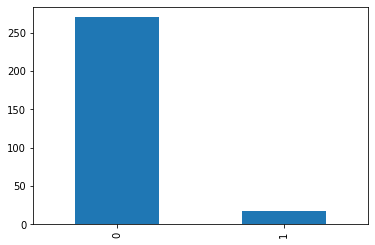

In [376]:
df1['Playoffs Games Won'].value_counts().plot.bar();

In [405]:
df1.isnull().sum()

Season                    0
TEAM                      0
Conference Standings      0
All Stars                 0
MVP                     270
Playoffs Games Won        0
GP                        0
W                         0
L                         0
WIN%                      0
MIN                       0
PTS                       0
FGM                       0
FGA                       0
FG%                       0
3PM                       0
3PA                       0
3P%                       0
FTM                       0
FTA                       0
FT%                       0
OREB                      0
DREB                      0
REB                       0
AST                       0
TOV                       0
STL                       0
BLK                       0
BLKA                      0
PF                        0
PFD                       0
+/-                       0
MIN.1                     0
OFFRTG                    0
DEFRTG                    0
NETRTG              

In [406]:
# fixing MVP col
def inputer5_nan(df,variable,arbitrary):
    '''
    will replace the na by an arbitrary choice.
    df=dataframe
    variable=the varibale as a string we want
    arbitrary = the arbitrary numeric number 
    '''
    df[variable]=df[variable].fillna(arbitrary)
    
inputer5_nan(df1,'MVP',0)
#inputer5_nan(df1,'Conference Standings',0)    

In [407]:
df1.isnull().sum()

Season                  0
TEAM                    0
Conference Standings    0
All Stars               0
MVP                     0
Playoffs Games Won      0
GP                      0
W                       0
L                       0
WIN%                    0
MIN                     0
PTS                     0
FGM                     0
FGA                     0
FG%                     0
3PM                     0
3PA                     0
3P%                     0
FTM                     0
FTA                     0
FT%                     0
OREB                    0
DREB                    0
REB                     0
AST                     0
TOV                     0
STL                     0
BLK                     0
BLKA                    0
PF                      0
PFD                     0
+/-                     0
MIN.1                   0
OFFRTG                  0
DEFRTG                  0
NETRTG                  0
AST%                    0
AST/TO Ratio            0
AST.1       

In [281]:
# fixing Conference Standings
def inputer5_nan(df,variable,arbitrary):
    '''
    will replace the na by an arbitrary choice.
    df=dataframe
    variable=the varibale as a string we want
    arbitrary = the arbitrary numeric number 
    '''
    df[variable]=df[variable].fillna(arbitrary)
    
inputer5_nan(df1,'Conference Standings',-1)
#inputer5_nan(df1,'Conference Standings',0) 

In [380]:
df1.isnull().sum()

Season                  0
TEAM                    0
Conference Standings    0
All Stars               0
MVP                     0
Playoffs Games Won      0
GP                      0
W                       0
L                       0
WIN%                    0
MIN                     0
PTS                     0
FGM                     0
FGA                     0
FG%                     0
3PM                     0
3PA                     0
3P%                     0
FTM                     0
FTA                     0
FT%                     0
OREB                    0
DREB                    0
REB                     0
AST                     0
TOV                     0
STL                     0
BLK                     0
BLKA                    0
PF                      0
PFD                     0
+/-                     0
MIN.1                   0
OFFRTG                  0
DEFRTG                  0
NETRTG                  0
AST%                    0
AST/TO Ratio            0
AST.1       

In [381]:
df1.dtypes

Season                   object
TEAM                     object
Conference Standings    float64
All Stars                 int64
MVP                     float64
Playoffs Games Won        int64
GP                        int64
W                         int64
L                         int64
WIN%                    float64
MIN                     float64
PTS                     float64
FGM                     float64
FGA                     float64
FG%                     float64
3PM                     float64
3PA                     float64
3P%                     float64
FTM                     float64
FTA                     float64
FT%                     float64
OREB                    float64
DREB                    float64
REB                     float64
AST                     float64
TOV                     float64
STL                     float64
BLK                     float64
BLKA                    float64
PF                      float64
PFD                     float64
+/-     

In [15]:
#df1.isnull().sum()
#df1 = df1['Playoffs Games Won'] != np.NaN

In [408]:
# convert the col with the string numbers to float 
df1['POSS'] = df['POSS'].str.replace(',', '').astype(float)

In [383]:
df1.dtypes

Season                   object
TEAM                     object
Conference Standings    float64
All Stars                 int64
MVP                     float64
Playoffs Games Won        int64
GP                        int64
W                         int64
L                         int64
WIN%                    float64
MIN                     float64
PTS                     float64
FGM                     float64
FGA                     float64
FG%                     float64
3PM                     float64
3PA                     float64
3P%                     float64
FTM                     float64
FTA                     float64
FT%                     float64
OREB                    float64
DREB                    float64
REB                     float64
AST                     float64
TOV                     float64
STL                     float64
BLK                     float64
BLKA                    float64
PF                      float64
PFD                     float64
+/-     

In [287]:
len(df1.columns)

48

In [288]:
len(df1)

538

In [427]:
X = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1) # random_state=0
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import Normalizer

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
number = y_train.value_counts()[0]

from imblearn.over_sampling import BorderlineSMOTE

#1 transform the dataset
#oversample = BorderlineSMOTE(sampling_strategy={0:number,1:number})
#X_train_os, y_train_os = oversample.fit_resample(X_train, y_train)

scaler = StandardScaler()
scaled_X_train_os = scaler.fit_transform(X_train) 
scaled_X_test = scaler.transform(X_test)

from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier()
knn_model.fit(scaled_X_train_os,y_train)

y_pred = knn_model.predict(scaled_X_test)

print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
#print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

y_test.value_counts()

[[69  0]
 [15  3]]
              precision    recall  f1-score   support

           0       0.82      1.00      0.90        69
           1       1.00      0.17      0.29        18

    accuracy                           0.83        87
   macro avg       0.91      0.58      0.59        87
weighted avg       0.86      0.83      0.77        87



0    69
1    18
Name: Playoffs Games Won, dtype: int64

In [691]:
# sunday 
#X = df1.drop(g,axis=1)
dict_f1 = {}
dummy = 0
num = np.arange(1,1000001,1)

for i in num:

    #X = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)
    X = df1[['MVP', 'W', 'L', 'PIE', 'BLK', 'DEFRTG', 'AST.1', '3P%']]
    y = df1['Playoffs Games Won']

    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import StandardScaler
    from sklearn.preprocessing import MinMaxScaler 
    from sklearn.preprocessing import RobustScaler

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=i)
    
    number = y_train.value_counts()[0]

    from imblearn.over_sampling import BorderlineSMOTE
    
    number1 = y_train.value_counts()[0]
    number2 = -int(-(number1*.40)//1)

    #1 transform the dataset
    oversample = BorderlineSMOTE(sampling_strategy={0:number1,1:number2},random_state=i,kind='borderline-1')
    X_train_os, y_train_os = oversample.fit_resample(X_train, y_train)

    scaler = StandardScaler()
    scaled_X_train_os = scaler.fit_transform(X_train_os) 
    scaled_X_test = scaler.transform(X_test)


    from sklearn.neighbors import KNeighborsClassifier

    knn_model = KNeighborsClassifier(n_neighbors=5,weights='distance',metric='euclidean')
    knn_model.fit(scaled_X_train_os,y_train_os)


    y_pred = knn_model.predict(scaled_X_test)
    
    if dummy == 0:
        f1 = round(f1_score(y_test,y_pred),5)
        
        print(f'{i} and {f1}')


        dummy = dummy + 1
        
    else:
        
        f1_new = round(f1_score(y_test,y_pred),5)
        
        if f1_new > f1:
            
            f1 = f1_new
            
            dict_f1 = {}
            
            dict_f1[f'{i}']=f1.round(5)

            order_f1 = dict(sorted(dict_f1.items(), key=lambda item: item[1]))
            
            print(order_f1,number)
            
        elif f1_new == f1:
            
            print(f'{i} and {f1_new}')
            
        else:
            
            None


1 and 0.25
3 and 0.25
{'5': 0.4} 199
{'8': 0.42857} 203
{'13': 0.47059} 204
{'17': 0.55556} 200
19 and 0.55556
{'133': 0.57143} 202
241 and 0.57143
{'258': 0.76923} 199
{'4187': 0.8} 199
5709 and 0.8
58097 and 0.8
{'67082': 0.81818} 205
{'69551': 0.85714} 197
{'102111': 0.875} 201
{'162745': 0.90909} 199


KeyboardInterrupt: 

6

In [454]:
# saturday 
#X = df1.drop(g,axis=1)
dict_f1 = {}
dummy = 0

for i in combo_features:

    #X = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)
    X = df1[i]
    y = df1['Playoffs Games Won']

    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import StandardScaler
    from sklearn.preprocessing import MinMaxScaler 
    from sklearn.preprocessing import RobustScaler

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=0)
    
    number = y_train.value_counts()[0]

    from imblearn.over_sampling import BorderlineSMOTE
    
    number1 = y_train.value_counts()[0]

    #1 transform the dataset
    oversample = 3(sampling_strategy={0:number1,1:number1},random_state=0,kind='borderline-1')
    X_train_os, y_train_os = oversample.fit_resample(X_train, y_train)

    scaler = StandardScaler()
    scaled_X_train_os = scaler.fit_transform(X_train_os) 
    scaled_X_test = scaler.transform(X_test)


    from sklearn.neighbors import KNeighborsClassifier

    knn_model = KNeighborsClassifier(n_neighbors=5)
    knn_model.fit(scaled_X_train_os,y_train_os)


    y_pred = knn_model.predict(scaled_X_test)
    
    if dummy == 0:
        f1 = round(f1_score(y_test,y_pred),5)
        
        print(f'{i} and {f1}')


        dummy = dummy + 1
        
    else:
        
        f1_new = round(f1_score(y_test,y_pred),5)
        
        if f1_new > f1:
            
            f1 = f1_new
            
            dict_f1 = {}
            
            dict_f1[f'{i}']=f1.round(5)

            order_f1 = dict(sorted(dict_f1.items(), key=lambda item: item[1]))
            
            print(order_f1,number)
            
        elif f1_new == f1:
            
            print(f'{i} and {f1_new}')
            
        else:
            
            None


['MVP'] and 0.0
{"['Conference Standings']": 0.5} 199
['MVP', 'Conference Standings'] and 0.5
{"['Conference Standings', 'WIN%']": 0.55556} 199
{"['Conference Standings', 'MIN']": 0.66667} 199
['FG%', 'BLKA', 'DEFRTG', 'OREB'] and 0.66667
['MVP', 'Conference Standings', 'WIN%', '+/-', 'BLK'] and 0.66667
['MVP', 'Conference Standings', 'L', 'BLKA', 'OFFRTG'] and 0.66667
['MVP', 'All Stars', 'PIE', 'FG%', 'TS%'] and 0.66667
['WIN%', '+/-', 'W', 'BLK', 'AST'] and 0.66667
{"['WIN%', '+/-', 'PIE', 'AST', 'FGM']": 0.71429} 199
['MVP', '+/-', 'W', 'FG%', 'BLKA', '3P%'] and 0.71429
['MVP', 'W', 'PIE', 'BLK', 'MIN', '3P%'] and 0.71429
['MVP', 'W', 'PIE', 'FG%', 'BLKA', '3P%'] and 0.71429
['MVP', 'W', 'PIE', 'AST', 'OFFRTG', 'FGM'] and 0.71429
['MVP', 'Conference Standings', 'WIN%', 'PIE', 'FG%', 'AST', '3P%'] and 0.71429
['MVP', 'Conference Standings', 'WIN%', 'BLK', 'FG%', 'DEFRTG', 'OREB'] and 0.71429
['MVP', '+/-', 'W', 'FG%', 'EFG%', 'BLKA', 'AST.1'] and 0.71429
['MVP', 'W', 'All Stars', 'P

KeyboardInterrupt: 

In [ ]:
{'258': 0.76923} 199
{'4187': 0.8} 199 yes
5709 and 0.8 no
58097 and 0.8 yes
{'67082': 0.81818} 205 yes
{'69551': 0.85714} 197
{'102111': 0.875} 201
{'162745': 0.90909} 199

In [772]:
# 58097
X = df1[['MVP', 'W', 'L', 'PIE', 'BLK', 'DEFRTG', 'AST.1', '3P%']]
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import Normalizer



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=58097)

# balance dataset
#################################################################################################################
from imblearn.over_sampling import BorderlineSMOTE

number1 = y_train.value_counts()[0]
number2 = -int(-(number1*.40)//1)

oversample = BorderlineSMOTE(sampling_strategy={0:number1,1:number2},random_state=58097)
X_train_os, y_train_os = oversample.fit_resample(X_train, y_train)
#################################################################################################################

# scale dataset
#################################################################################################################
scaler = StandardScaler()
scaled_X_train_os = scaler.fit_transform(X_train_os) 
scaled_X_test = scaler.transform(X_test)
#################################################################################################################
#################################################################################################################
#################################################################################################################
#################################################################################################################
#################################################################################################################

# fit knn model
#################################################################################################################
from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier(n_neighbors=5,weights='distance',metric='euclidean')
knn_model.fit(scaled_X_train_os,y_train_os)
#################################################################################################################

# evalute dataset
#################################################################################################################
y_pred = knn_model.predict(scaled_X_test)

from sklearn.metrics import confusion_matrix,accuracy_score,classification_report

print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(classification_report(y_test,y_pred)) # model classication report
#################################################################################################################

[[52  1]
 [ 1  4]]
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        53
           1       0.80      0.80      0.80         5

    accuracy                           0.97        58
   macro avg       0.89      0.89      0.89        58
weighted avg       0.97      0.97      0.97        58



In [773]:
# knn
knn_model = KNeighborsClassifier(n_neighbors=5,weights='distance',metric='euclidean')
from sklearn.model_selection import cross_val_score

skfold=StratifiedKFold(n_splits=5)


results=cross_val_score(knn_model,scaled_X_train_os,y_train_os,cv=skfold,scoring='f1')
print(results)
print(np.mean(results))
print(np.std(results))

[0.6875     0.82352941 0.77777778 0.875      0.78787879]
0.7903371954842544
0.06165838986906284


In [749]:
np.mean(results)+np.std(results)

0.836901599896203

In [530]:
clf['train_score']

array([0.89714286, 0.89655172, 0.88095238, 0.88757396, 0.88888889])

In [484]:
print('mean train set accuracy: ', np.mean(clf['train_score']), ' +- ', np.std(clf['train_score']))
print('mean test set accuracy: ', np.mean(clf['test_score']), ' +- ', np.std(clf['test_score']))

mean train set accuracy:  0.89022196312382  +-  0.006044481545919763
mean test set accuracy:  0.8676555215221805  +-  0.03442339285222176


In [ ]:
# {"['WIN%', 'MVP', 'PIE', 'BLK', 'MIN']": 0.76923} 109132277 2632

In [ ]:
#X = df1.drop(g,axis=1)
dict_f1 = {}
dummy = 0

for i in combo_features:


    X = df1[['MVP', '+/-', 'L', 'PIE', 'MIN', 'BLKA', 'DEFRTG']]
    y = df1['Playoffs Games Won']

    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import StandardScaler
    from sklearn.preprocessing import MinMaxScaler 
    from sklearn.preprocessing import RobustScaler
    from sklearn.preprocessing import MaxAbsScaler
    from sklearn.preprocessing import Normalizer



    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

    # balance dataset
    #################################################################################################################
    from imblearn.over_sampling import BorderlineSMOTE

    number1 = y_train.value_counts()[0]
    number2 = round(y_train.value_counts()[0]*.46)

    oversample = BorderlineSMOTE(k_neighbors=3,sampling_strategy={0:number1,1:number1},random_state=0,m_neighbors=9,kind='borderline-1')
    X_train_os, y_train_os = oversample.fit_resample(X_train, y_train)
    #################################################################################################################

    # scale dataset
    #################################################################################################################
    scaler = StandardScaler()
    scaled_X_train_os = scaler.fit_transform(X_train_os) 
    scaled_X_test = scaler.transform(X_test)
    #################################################################################################################
    #################################################################################################################
    #################################################################################################################
    #################################################################################################################
    #################################################################################################################

    # fit knn model
    #################################################################################################################
    from sklearn.neighbors import KNeighborsClassifier

    knn_model = KNeighborsClassifier(n_neighbors=5,metric='euclidean',weights='distance')
    knn_model.fit(scaled_X_train_os,y_train_os)
    #################################################################################################################

    # evalute dataset
    #################################################################################################################
    y_pred = knn_model.predict(scaled_X_test)

    from sklearn.metrics import confusion_matrix,accuracy_score,classification_report

    print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
    print(classification_report(y_test,y_pred)) # model classication report
    #################################################################################################################

In [448]:
X = df1[['MVP', '+/-', 'L', 'PIE', 'MIN', 'BLKA', 'DEFRTG']]
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import Normalizer



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# balance dataset
#################################################################################################################
from imblearn.over_sampling import BorderlineSMOTE

number1 = y_train.value_counts()[0]
number2 = round(y_train.value_counts()[0]*.46)

oversample = BorderlineSMOTE(k_neighbors=3,sampling_strategy={0:number1,1:number1},random_state=0,m_neighbors=9,kind='borderline-1')
X_train_os, y_train_os = oversample.fit_resample(X_train, y_train)
#################################################################################################################

# scale dataset
#################################################################################################################
scaler = StandardScaler()
scaled_X_train_os = scaler.fit_transform(X_train_os) 
scaled_X_test = scaler.transform(X_test)
#################################################################################################################
#################################################################################################################
#################################################################################################################
#################################################################################################################
#################################################################################################################

# fit knn model
#################################################################################################################
from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier(n_neighbors=5,metric='euclidean',weights='distance')
knn_model.fit(scaled_X_train_os,y_train_os)
#################################################################################################################

# evalute dataset
#################################################################################################################
y_pred = knn_model.predict(scaled_X_test)

from sklearn.metrics import confusion_matrix,accuracy_score,classification_report

print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(classification_report(y_test,y_pred)) # model classication report
#################################################################################################################






[[44  9]
 [ 1  4]]
              precision    recall  f1-score   support

           0       0.98      0.83      0.90        53
           1       0.31      0.80      0.44         5

    accuracy                           0.83        58
   macro avg       0.64      0.82      0.67        58
weighted avg       0.92      0.83      0.86        58



In [240]:
data2 = pd.read_csv('nba_test.csv') # Upload Data
#data.drop(['Unnamed: 29','Unnamed: 30'],axis=1,inplace=True) # Delete the last 2 cols because they are blank
#df = data.copy()
data2.head(2)

,TEAM,MVP,GP,W,L,WIN%,MIN,PTS,FGM,FGA,...,AST.1,OREB%,DREB%,REB%,TOV%,EFG%,TS%,PACE,PIE,POSS
0,Washington Wizards,0,72,34,38,0.472,48.3,116.6,43.2,90.9,...,17.8,25.0,73.6,49.4,13.7,53.1,56.9,104.67,49.6,"7,585"
1,Utah Jazz,0,72,52,20,0.722,48.2,116.4,41.3,88.1,...,17.3,28.4,75.7,52.9,14.2,56.3,59.7,99.37,54.2,"7,193"


In [239]:
X = df1[['MVP', '+/-', 'L', 'PIE', 'MIN', 'BLKA', 'DEFRTG']]
#X = df1[['Conference Standings','WIN%','MVP','+/-','W','All Stars','L','PIE','NETRTG','BLK','FG%']]
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2632)



scaler = RobustScaler()
scaled_X_train = scaler.fit_transform(X_train) 
scaled_X_test = scaler.transform(X_test)

number = y_train.value_counts()[0]

#1 transform the dataset
#oversample = SMOTE(sampling_strategy={0:number,1:number},random_state=random_number)
#scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

from imblearn.over_sampling import BorderlineSMOTE

#1 transform the dataset
oversample = BorderlineSMOTE(k_neighbors=1,sampling_strategy={0:189,1:87},random_state=2632,m_neighbors=11,kind='borderline-1')
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier(n_neighbors=5,metric='euclidean',weights='distance')
knn_model.fit(scaled_X_train_os,y_train_os)


y_pred = knn_model.predict(scaled_X_test)

print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

In [182]:
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.pipeline import Pipeline


knn_pipe = imbpipeline(steps = [['BorderlineSMOTE', BorderlineSMOTE(k_neighbors=2,sampling_strategy={0:189,1:189},random_state=2632,m_neighbors=9,kind='borderline-1')],
                                ['scaler', StandardScaler()],
                                ['classifier',KNeighborsClassifier(n_neighbors=3,metric='euclidean',weights='distance')]])

stratified_kfold = StratifiedKFold(n_splits=5,
                                   shuffle=True,
                                   random_state=2632)
    
param_grid = {'classifier__n_neighbors':[2,3,4,5]}

grid_search = GridSearchCV(estimator=knn_pipe,
                           param_grid=param_grid,
                           scoring='f1',
                           cv=stratified_kfold,
                           n_jobs=-1)

grid_search.fit(scaled_X_train_os,y_train_os)
cv_score = grid_search.best_score_
test_score = grid_search.score(scaled_X_test, y_test)
print(f'Cross-validation score: {cv_score}\nTest score: {test_score}')

Cross-validation score: 0.950180621066697
Test score: 0.6666666666666666


In [184]:
grid_search.best_score_

0.950180621066697

In [185]:
grid_search.best_params_

{'classifier__n_neighbors': 2}

In [31]:
#X = df1.drop(g,axis=1)
from sklearn.metrics import f1_score


X = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

#1 transform the dataset
oversample = SMOTE(sampling_strategy={0:189,1:189},random_state=0)
X_train_os, y_train_os = oversample.fit_resample(X_train, y_train)

scaler = StandardScaler()
scaled_X_train_os = scaler.fit_transform(X_train_os) 
scaled_X_test = scaler.transform(X_test)



from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier()
knn_model.fit(scaled_X_train_os,y_train_os)


y_pred = knn_model.predict(scaled_X_test)
n = f1_score(y_test,y_pred)

n

0.3846153846153846

In [294]:
import itertools

list_names = ['Conference Standings', 'All Stars', 'MVP', 'GP', 'W', 'L', 'WIN%',
       'MIN', 'PTS', 'FGM', 'FGA', 'FG%', '3PM', '3PA', '3P%', 'FTM', 'FTA',
       'FT%', 'OREB', 'DREB', 'REB', 'AST', 'TOV', 'STL', 'BLK', 'BLKA', 'PF',
       'PFD', '+/-']

X.columns

0   Conference Standings  6.540287
6                   WIN%  3.446102
2                    MVP  3.333333
28                   +/-  2.982860
4                      W  2.669243
1              All Stars  2.385816
5                      L  2.169797
43                   PIE  2.009009
32                NETRTG  1.583150
24                   BLK  0.916734
11                   FG%  0.910491
40                  EFG%  0.661123
7                    MIN  0.575671
41                   TS%  0.559191
25                  BLKA  0.530858
21                   AST  0.468861
31                DEFRTG  0.454594
30                OFFRTG  0.311931
35                 AST.1  0.264564
14                   3P%  0.228183

0   Conference Standings  6.540287
6                   WIN%  3.446102
2                    MVP  3.333333
28                   +/-  2.982860
4                      W  2.669243
1              All Stars  2.385816
5                      L  2.169797
43                   PIE  2.009009
32                NETRTG  1.583150
24                   BLK  0.916734
11                   FG%  0.910491
40                  EFG%  0.661123
7                    MIN  0.575671
41                   TS%  0.559191
25                  BLKA  0.530858
21                   AST  0.468861
31                DEFRTG  0.454594
30                OFFRTG  0.311931
35                 AST.1  0.264564
14                   3P%  0.228183
9                    FGM  0.222399

0   Conference Standings  6.540287
6                   WIN%  3.446102
2                    MVP  3.333333
28                   +/-  2.982860
4                      W  2.669243
1              All Stars  2.385816
5                      L  2.169797
43                   PIE  2.009009
32                NETRTG  1.583150
24                   BLK  0.916734
11                   FG%  0.910491
40                  EFG%  0.661123
7                    MIN  0.575671
41                   TS%  0.559191
25                  BLKA  0.530858
21                   AST  0.468861
31                DEFRTG  0.454594
30                OFFRTG  0.311931
35                 AST.1  0.264564
14                   3P%  0.228183
9                    FGM  0.222399
18                  OREB

Index(['Conference Standings', 'All Stars', 'MVP', 'GP', 'W', 'L', 'WIN%',
       'MIN', 'PTS', 'FGM', 'FGA', 'FG%', '3PM', '3PA', '3P%', 'FTM', 'FTA',
       'FT%', 'OREB', 'DREB', 'REB', 'AST', 'TOV', 'STL', 'BLK', 'BLKA', 'PF',
       'PFD', '+/-', 'MIN.1', 'OFFRTG', 'DEFRTG', 'NETRTG', 'AST%',
       'AST/TO Ratio', 'AST.1', 'OREB%', 'DREB%', 'REB%', 'TOV%', 'EFG%',
       'TS%', 'PACE', 'PIE', 'POSS'],
      dtype='object')

In [451]:
import itertools
features = df1[['MVP','Conference Standings','WIN%','+/-','W','All Stars','L','PIE','NETRTG','BLK', 'FG%','EFG%','MIN','TS%','BLKA','AST','DEFRTG','OFFRTG','AST.1','3P%','FGM','OREB']]
#features = df1[['Conference Standings', 'All Stars', 'MVP', 'GP', 'W', 'L', 'WIN%',
      
combo_features = []
for i in range(1, len(features)+1):
    new_item = [list(x) for x in itertools.combinations(features, i)]
    combo_features.extend(new_item)

In [993]:
combo_features = combo_features[::-1]

In [452]:
combo_features

[['MVP'],
 ['Conference Standings'],
 ['WIN%'],
 ['+/-'],
 ['W'],
 ['All Stars'],
 ['L'],
 ['PIE'],
 ['NETRTG'],
 ['BLK'],
 ['FG%'],
 ['EFG%'],
 ['MIN'],
 ['TS%'],
 ['BLKA'],
 ['AST'],
 ['DEFRTG'],
 ['OFFRTG'],
 ['AST.1'],
 ['3P%'],
 ['FGM'],
 ['OREB'],
 ['MVP', 'Conference Standings'],
 ['MVP', 'WIN%'],
 ['MVP', '+/-'],
 ['MVP', 'W'],
 ['MVP', 'All Stars'],
 ['MVP', 'L'],
 ['MVP', 'PIE'],
 ['MVP', 'NETRTG'],
 ['MVP', 'BLK'],
 ['MVP', 'FG%'],
 ['MVP', 'EFG%'],
 ['MVP', 'MIN'],
 ['MVP', 'TS%'],
 ['MVP', 'BLKA'],
 ['MVP', 'AST'],
 ['MVP', 'DEFRTG'],
 ['MVP', 'OFFRTG'],
 ['MVP', 'AST.1'],
 ['MVP', '3P%'],
 ['MVP', 'FGM'],
 ['MVP', 'OREB'],
 ['Conference Standings', 'WIN%'],
 ['Conference Standings', '+/-'],
 ['Conference Standings', 'W'],
 ['Conference Standings', 'All Stars'],
 ['Conference Standings', 'L'],
 ['Conference Standings', 'PIE'],
 ['Conference Standings', 'NETRTG'],
 ['Conference Standings', 'BLK'],
 ['Conference Standings', 'FG%'],
 ['Conference Standings', 'EFG%'],
 ['Confe

In [1005]:
#X = df1.drop(g,axis=1)
dict_f1 = {}
dummy = 0

for i in combo_features:

    #X = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)
    X = df1[i]
    y = df1['Playoffs Games Won']

    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import StandardScaler
    from sklearn.preprocessing import MinMaxScaler 
    from sklearn.preprocessing import RobustScaler

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_number)



    scaler = RobustScaler()
    scaled_X_train = scaler.fit_transform(X_train) 
    scaled_X_test = scaler.transform(X_test)

    number = y_train.value_counts()[0]

    #1 transform the dataset
    #oversample = SMOTE(sampling_strategy={0:number,1:number},random_state=random_number)
    #scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)
    
    from imblearn.over_sampling import BorderlineSMOTE

    #1 transform the dataset
    oversample = BorderlineSMOTE(k_neighbors=1,sampling_strategy={0:189,1:105},random_state=random_number,m_neighbors=11,kind='borderline-1')
    scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

    from sklearn.neighbors import KNeighborsClassifier

    knn_model = LogisticRegression()
    knn_model.fit(scaled_X_train_os,y_train_os)


    y_pred = knn_model.predict(scaled_X_test)
    
    if dummy == 0:
        f1 = round(f1_score(y_test,y_pred),5)
        
        print(f'{i} and {f1}')


        dummy = dummy + 1
        
    else:
        
        f1_new = round(f1_score(y_test,y_pred),5)
        
        if f1_new > f1:
            
            f1 = f1_new
            
            dict_f1 = {}
            
            dict_f1[f'{i}']=f1.round(5)

            order_f1 = dict(sorted(
            
            print(order_f1)
            
        else:
            
            None


['Conference Standings', 'WIN%', 'MVP', '+/-', 'W', 'All Stars', 'L', 'PIE', 'NETRTG', 'BLK', 'FG%', 'EFG%', 'MIN', 'TS%', 'BLKA', 'AST', 'DEFRTG', 'OFFRTG', 'AST.1', '3P%', 'FGM', 'OREB'] and 0.43478
['Conference Standings', 'WIN%', 'MVP', '+/-', 'W', 'All Stars', 'L', 'PIE', 'NETRTG', 'BLK', 'FG%', 'EFG%', 'MIN', 'TS%', 'AST', 'DEFRTG', 'OFFRTG', 'AST.1', '3P%', 'FGM', 'OREB'] and 0.45455
['Conference Standings', 'WIN%', 'MVP', '+/-', 'W', 'All Stars', 'L', 'PIE', 'NETRTG', 'BLK', 'FG%', 'EFG%', 'MIN', 'TS%', 'AST', 'DEFRTG', 'OFFRTG', 'AST.1', '3P%', 'FGM'] and 0.47619


KeyboardInterrupt: 

In [ ]:
  Conference Standings  6.540287
6                   WIN%  3.446102
2                    MVP  3.333333
28                   +/-  2.982860
4                      W  2.669243
1              All Stars  2.385816
5                      L  2.169797
43                   PIE  2.009009
32                NETRTG  1.583150
24                   BLK  0.916734
11                   FG%  0.910491

In [1024]:
#X = df1[['MVP', '+/-', 'L', 'PIE', 'MIN', 'BLKA', 'DEFRTG']]
X = df1[['Conference Standings','WIN%','MVP','+/-','W','All Stars','L','PIE','NETRTG','BLK','FG%']]
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler

n = np.arange(1,9999,1)
dict_f1 = {}
dummy = 0

for i in n:

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i)



    scaler = RobustScaler()
    scaled_X_train = scaler.fit_transform(X_train) 
    scaled_X_test = scaler.transform(X_test)

    number = y_train.value_counts()[0]

    #1 transform the dataset
    #oversample = SMOTE(sampling_strategy={0:number,1:number},random_state=random_number)
    #scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

    from imblearn.over_sampling import BorderlineSMOTE

    #1 transform the dataset
    oversample = BorderlineSMOTE(k_neighbors=1,sampling_strategy={0:number,1:number},random_state=i,m_neighbors=11,kind='borderline-1')
    scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

    from sklearn.neighbors import KNeighborsClassifier

    knn_model = KNeighborsClassifier(n_neighbors=5,metric='euclidean',weights='distance')
    knn_model.fit(scaled_X_train_os,y_train_os)


    y_pred = knn_model.predict(scaled_X_test)

    
    if dummy == 0:
        
        f1 = round(f1_score(y_test,y_pred),5)
        
        print(f'{i} and {f1}')


        dummy = dummy + 1
        
        
    else:
        
        f1_new = round(f1_score(y_test,y_pred),5)
    
        
        if f1_new > f1:
            
            f1 = f1_new
            
            print(f'{i} and {f1}')
            
        else:
            
            None

    #print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
    #print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
    #print(classification_report(y_test,y_pred)) # model classication report

1 and 0.11765
3 and 0.13333
4 and 0.28571
8 and 0.33333
15 and 0.36364
29 and 0.4
67 and 0.42857
182 and 0.46154
211 and 0.47059
221 and 0.57143


KeyboardInterrupt: 

In [ ]:
 if dummy == 0:
        f1 = round(f1_score(y_test,y_pred),5)
        
        print(f'{i} and {f1}')


        dummy = dummy + 1
        
    else:
        
        f1_new = round(f1_score(y_test,y_pred),5)
        
        if f1_new > f1:
            
            f1 = f1_new
            
            print(f'{i} and {f1}')
            
        else:
            
            None
            
######################################################################
            
             if dummy == 0:
        f1 = round(f1_score(y_test,y_pred),5)

        dict_f1[f'{i}']=f1

        order_f1 = dict(sorted(dict_f1.items(), key=lambda item: item[1]))

        dummy = dummy + 1
        
        
        print(order_f1)
        
    else:
        
        f1_new = round(f1_score(y_test,y_pred),5)
        
        if f1_new > f1:
            
            f1 = f1_new
            
            dict_f1 = {}
            
            dict_f1[f'{i}']=f1.round(5)

            order_f1 = dict(sorted(dict_f1.items(), key=lambda item: item[1]))
            
            print(order_f1)
            
        else:
            
            None


    #print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
    #print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
    #print(classification_report(y_test,y_pred)) # model classication report
            
            
            

In [94]:
# {"['MVP', '+/-', 'L', 'PIE', 'MIN', 'BLKA', 'DEFRTG']": 0.6}

#X = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)
X = df1[['MVP', '+/-', 'L', 'PIE', 'MIN', 'BLKA', 'DEFRTG']]
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=109132277)



scaler = RobustScaler()
scaled_X_train = scaler.fit_transform(X_train) 
scaled_X_test = scaler.transform(X_test)

number = y_train.value_counts()[0]

#1 transform the dataset
#oversample = SMOTE(sampling_strategy={0:number,1:number},random_state=random_number)
#scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

from imblearn.over_sampling import BorderlineSMOTE

#1 transform the dataset
oversample = BorderlineSMOTE(k_neighbors=1,sampling_strategy={0:189,1:105},random_state=109132277,m_neighbors=11,kind='borderline-1')
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier(n_neighbors=5,metric='euclidean',weights='distance',)
knn_model.fit(scaled_X_train_os,y_train_os)


y_pred = knn_model.predict(scaled_X_test)

f1 = round(f1_score(y_test,y_pred),5)

print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[78  3]
 [ 1  5]]
0.9540229885057471
              precision    recall  f1-score   support

           0       0.99      0.96      0.97        81
           1       0.62      0.83      0.71         6

    accuracy                           0.95        87
   macro avg       0.81      0.90      0.84        87
weighted avg       0.96      0.95      0.96        87



In [926]:
# conda install -c conda-forge xgboost

import xgboost

from sklearn.ensemble import (
    RandomForestClassifier,
    BaggingClassifier,
    AdaBoostClassifier,
)

In [952]:
bag = BaggingClassifier(base_estimator=knn_model,n_estimators=100, random_state=random_number)
bag.fit(scaled_X_train_os,y_train_os)

y_pred = bag.predict(scaled_X_test)

print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[78  3]
 [ 1  5]]
0.9540229885057471
              precision    recall  f1-score   support

           0       0.99      0.96      0.97        81
           1       0.62      0.83      0.71         6

    accuracy                           0.95        87
   macro avg       0.81      0.90      0.84        87
weighted avg       0.96      0.95      0.96        87



In [1078]:
X = df1[['MVP', '+/-', 'L', 'PIE', 'MIN', 'BLKA', 'DEFRTG']]
#X = df1[['Conference Standings','WIN%','MVP','+/-','W','All Stars','L','PIE','NETRTG','BLK','FG%']]
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2632)



scaler = RobustScaler()
scaled_X_train = scaler.fit_transform(X_train) 
scaled_X_test = scaler.transform(X_test)

number = y_train.value_counts()[0]

#1 transform the dataset
#oversample = SMOTE(sampling_strategy={0:number,1:number},random_state=random_number)
#scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

from imblearn.over_sampling import BorderlineSMOTE

#1 transform the dataset
oversample = BorderlineSMOTE(k_neighbors=1,sampling_strategy={0:189,1:87},random_state=2632,m_neighbors=11,kind='borderline-1')
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier(n_neighbors=5,metric='euclidean',weights='distance')
knn_model.fit(scaled_X_train_os,y_train_os)


y_pred = knn_model.predict(scaled_X_test)

print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[80  1]
 [ 0  6]]
0.9885057471264368
              precision    recall  f1-score   support

           0       1.00      0.99      0.99        81
           1       0.86      1.00      0.92         6

    accuracy                           0.99        87
   macro avg       0.93      0.99      0.96        87
weighted avg       0.99      0.99      0.99        87



In [656]:
X = df1[['MVP', '+/-', 'L', 'PIE', 'MIN', 'BLKA', 'DEFRTG']]
#X = df1[['Conference Standings','WIN%','MVP','+/-','W','All Stars','L','PIE','NETRTG','BLK','FG%']]
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2632)



scaler = RobustScaler()
scaled_X_train = scaler.fit_transform(X_train) 
scaled_X_test = scaler.transform(X_test)

number = y_train.value_counts()[0]

#1 transform the dataset
#oversample = SMOTE(sampling_strategy={0:number,1:number},random_state=random_number)
#scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

from imblearn.over_sampling import BorderlineSMOTE

#1 transform the dataset
oversample = BorderlineSMOTE(k_neighbors=1,sampling_strategy={0:189,1:87},random_state=2632,m_neighbors=11,kind='borderline-1')
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier(n_neighbors=5,metric='euclidean',weights='distance')
knn_model.fit(scaled_X_train_os,y_train_os)


y_pred = knn_model.predict(scaled_X_test)

print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[74  4]
 [ 3  6]]
0.9195402298850575
              precision    recall  f1-score   support

           0       0.96      0.95      0.95        78
           1       0.60      0.67      0.63         9

    accuracy                           0.92        87
   macro avg       0.78      0.81      0.79        87
weighted avg       0.92      0.92      0.92        87



In [1082]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random as r

from sklearn.datasets import load_breast_cancer
from sklearn.ensemble import RandomForestClassifier # type of regression
from sklearn.linear_model import LogisticRegression  # type of regression
from sklearn.metrics import accuracy_score # metric to use. There are others.
from sklearn.pipeline import Pipeline

from sklearn.model_selection import (KFold,GridSearchCV,train_test_split)

#f1_score(y_test,y_pred)



array([[ 0.        ,  0.53846154, -1.        , ..., -0.66666667,
         0.33333333, -0.41304348],
       [ 0.        , -0.56410256,  0.77777778, ...,  0.        ,
         1.        , -0.63043478],
       [ 0.        , -0.71794872,  0.88888889, ...,  0.66666667,
         0.44444444,  0.5       ],
       ...,
       [ 0.        ,  0.21418609, -0.54689954, ..., -0.59480639,
        -1.02395343, -0.05454491],
       [ 0.        ,  0.17904755, -0.2931212 , ..., -0.44253938,
        -1.07470909, -0.12405811],
       [ 0.        ,  1.20694979, -0.85053626, ..., -0.11505787,
         0.17202931, -1.27124396]])

In [1119]:
def nested_cross_val(model, grid,K):
    '''
    model=the regresser/classifer
    grid=the model's hyperpameters as a dictionary
    K= number of folds.It is usally 5 or 10
    
    if we want to change the metric from 'accuracy' to a differnt scoring metric,
    please change #6,9,10,11, and 12.
    
    common Classification metrics: [accuracy_score,f1_score,precision_score,recall_score]
    common Regression metrics: [r2_score,neg_root_mean_squared_error,neg_mean_squared_error]
    
    '''

    #1 configure the outer loop cross-validation procedure
    cv_outer = KFold(n_splits=K, shuffle=True, random_state=2632)
    
    #n_splits= the number of k 
    #shuffle=True if you want the data shuffle
    #random_state= to get consistent random data
    ##########################################################################################

    #2 configure the inner loop cross-validation procedure
    cv_inner = KFold(n_splits=K, shuffle=True, random_state=2632)
    
    #3 cv_inner = the k we want
                     
    #n_splits= the number of k 
    #shuffle=True if you want the data shuffle
    #random_state= to get consistent random data
    ##########################################################################################

    #4 enumerate splits
    outer_results = []
    inner_results = []
    
    #5 #########################################################################################

    for train_ix, test_ix in cv_outer.split(scaled_X_train_os):

        # split data
        xtrain, xtest = pd.DataFrame(scaled_X_train_os).loc[train_ix, :], pd.DataFrame(scaled_X_train_os).loc[test_ix, :]
        ytrain, ytest = y_train_os[train_ix], y_train_os[test_ix]
        
        ##########################################################################################

        #6 define gridsearch
        best_submodel = GridSearchCV(model, grid, scoring='f1', cv=cv_inner, refit=True)
        
        # model = the type of model
        # grid = the hyberparamters we want to optimize to find the best meric
        # scoring=scoring metric 
        # cv=number of k
        # refit=True
        # search = best_submodel
        
        ##########################################################################################

        #7 execute search
        best_submodel.fit(xtrain, ytrain)
        
        ##########################################################################################

        #8 evaluate model on the hold out dataset
        yhat = best_submodel.predict(xtest)
        
        ##########################################################################################

        #9 evaluate the model(metric)
        f1 = f1_score(ytest, yhat)
        
        ##########################################################################################

        #10 store the result
        outer_results.append(f1)
        
        inner_results.append(best_submodel.best_score_)
        
        ##########################################################################################

        #11 report progress
        print(f'f1_outer:{f1:.5f}, f1_inner:{best_submodel.best_score_:.5f}, cfg=[{best_submodel.best_params_}]') 
        
        ##########################################################################################

    #12 summarize the estimated performance of the model
    print()
    print(f'f1_outer:{np.mean(outer_results):.5f} +- {np.std(outer_results):.5f}')
    print(f'f1_inner:{np.mean(inner_results):.5f} +- {np.std(inner_results):.5f}')

    return best_submodel.fit(scaled_X_train_os,y_train_os)

In [1134]:
from sklearn.preprocessing import RobustScaler
scaler=RobustScaler() # if no scale,, hashtag this
knn = KNeighborsClassifier()

#### pipeline ######
pipeline = Pipeline([('scaler',scaler), ('knn',knn)])

# knn 
#knn_it = LogisticRegression(penalty ='l2',
                           #C=1,
                           #solver='liblinear',
                           #random_state=random_number,
                           #max_iter=10000)

# hyperparameter space as a dictionary
knn_param = {'knn__n_neighbors':[5],
             'knn__weights':['distance'],
             'knn__metric':['euclidean']}             

In [1144]:
# will take awhile. Make sure a lot of things are not running
knn_best_model = nested_cross_val(pipeline, knn_param,5)

f1_outer:0.86486, f1_inner:0.86353, cfg=[{'knn__metric': 'euclidean', 'knn__n_neighbors': 5, 'knn__weights': 'distance'}]
f1_outer:0.90000, f1_inner:0.85641, cfg=[{'knn__metric': 'euclidean', 'knn__n_neighbors': 5, 'knn__weights': 'distance'}]
f1_outer:0.90323, f1_inner:0.84247, cfg=[{'knn__metric': 'euclidean', 'knn__n_neighbors': 5, 'knn__weights': 'distance'}]
f1_outer:0.91304, f1_inner:0.84290, cfg=[{'knn__metric': 'euclidean', 'knn__n_neighbors': 5, 'knn__weights': 'distance'}]
f1_outer:0.80000, f1_inner:0.87931, cfg=[{'knn__metric': 'euclidean', 'knn__n_neighbors': 5, 'knn__weights': 'distance'}]

f1_outer:0.87623 +- 0.04145
f1_inner:0.85692 +- 0.01379


In [1143]:
# let's get the predictions

X_train_preds = knn_best_model.predict(scaled_X_train_os)
X_test_preds = knn_best_model.predict(scaled_X_test)

# let's examine the accuracy
print('Train f1 score: ', f1_score(y_train_os, X_train_preds).round(5))
print('Test f1 score: ', f1_score(y_test, X_test_preds).round(5))

Train f1 score:  1.0
Test f1 score:  0.85714


In [487]:

'minkowski','euclidean','chebyshev','manhattan','wminkowski','seuclidean','mahalanobis
# {"['MVP', '+/-', 'L', 'PIE', 'MIN', 'BLKA', 'DEFRTG']": 0.6} 
# random_number 109132277

# random_number 2632 and 0.85714 for f1

109132277

In [237]:
y_train.value_counts()

0    189
1     12
Name: Playoffs Games Won, dtype: int64

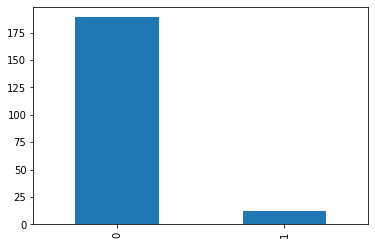

In [238]:
y_train.value_counts().plot.bar();

In [892]:
#1 transform the dataset
oversample = SMOTE(sampling_strategy={0:189,1:189},random_state=random_number)
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)



In [592]:
from imblearn.over_sampling import ADASYN

#1 transform the dataset
oversample = ADASYN(sampling_strategy={0:216,1:216},random_state=random_number)
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

In [ ]:
from imblearn.over_sampling import BorderlineSMOTE

#1 transform the dataset
oversample = BorderlineSMOTE(k_neighbors=9,sampling_strategy={0:191,1:191},random_state=random_number,m_neighbors=1,kind='borderline-1')
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

In [651]:
from imblearn.over_sampling import SVMSMOTE

#1 transform the dataset
oversample = SVMSMOTE(sampling_strategy={0:177,1:177},random_state=random_number,)
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

ValueError: With over-sampling methods, the number of samples in a class should be greater or equal to the original number of samples. Originally, there is 188 samples and 177 samples are asked.

In [597]:
from imblearn.over_sampling import KMeansSMOTE
from sklearn.cluster import KMeans

#1 transform the dataset
oversample = KMeansSMOTE(k_neighbors=2,sampling_strategy={0:361,1:361},random_state=random_number,kmeans_estimator=KMeans(n_clusters=1, random_state=random_number))
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

In [565]:
from imblearn.under_sampling import RandomUnderSampler

#1 transform the dataset
oversample = RandomUnderSampler(random_state=random_number,replacement=True)
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)


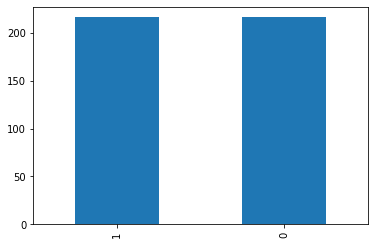

In [850]:
y_train_os.value_counts().plot.bar();

#2 transform the dataset #borderline-2
from imblearn.over_sampling import BorderlineSMOTE

oversample = BorderlineSMOTE(kind = 'borderline-1')
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)    

#3 transform the dataset
from imblearn.over_sampling import SVMSMOTE


oversample = SVMSMOTE()
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)    

#4 transform the dataset
from imblearn.over_sampling import ADASYN


oversample = ADASYN()
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)    

#5 transform the dataset
from imblearn.over_sampling import RandomOverSampler

oversample = RandomOverSampler()
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)    

In [36]:
y_test.value_counts()

0    79
1     8
Name: Playoffs Games Won, dtype: int64

In [150]:
X = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler

for i in range(1,101):
    

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_number)

random_number = i



scaler = RobustScaler()
scaled_X_train = scaler.fit_transform(X_train) 
scaled_X_test = scaler.transform(X_test)


from imblearn.over_sampling import BorderlineSMOTE

#1 transform the dataset
oversample = BorderlineSMOTE(k_neighbors=9,sampling_strategy={0:216,1:216},random_state=random_number,m_neighbors=10,kind='borderline-1')
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)



from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

knn_model = KNeighborsClassifier(n_neighbors=6)
knn_model.fit(scaled_X_train_os,y_train_os)




from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

y_pred = knn_model.predict(scaled_X_test)
print(f1_score(y_test,y_pred))
#print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
#print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
#print(classification_report(y_test,y_pred)) # model classication report

# robust, borderline 1, m nieh 10, neih 9, knn = 6----> .50 and .72

#  ['auto','ball_tree','kd_tree','brute']

ValueError: With over-sampling methods, the number of samples in a class should be greater or equal to the original number of samples. Originally, there is 219 samples and 216 samples are asked.

In [148]:
random_number

263963859

In [147]:
from sklearn.metrics import f1_score
print(f1_score(y_test,y_pred))


0.31578947368421056


In [904]:
#elbow method part 1

error_rate =[]

# will take some time
for i in range(1,61):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(scaled_X_train_os,y_train_os)
    pred_i = knn.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

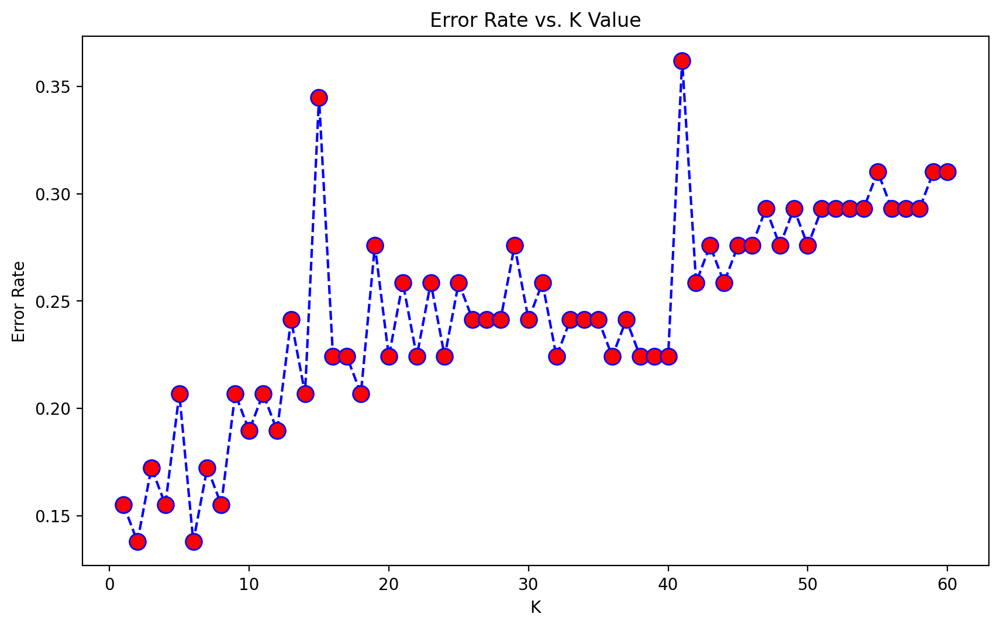

In [905]:
#elbow method part 2
plt.figure(figsize=(10,6),dpi=200)
plt.plot(range(1,61),error_rate,color='blue',linestyle='dashed',marker='o',markerfacecolor='red',markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate');
# looks like 16 or 15  gives the best k from the graph

In [395]:
df1.head(2)

,Season,TEAM,Conference Standings,All Stars,MVP,Playoffs Games Won,GP,W,L,WIN%,...,AST.1,OREB%,DREB%,REB%,TOV%,EFG%,TS%,PACE,PIE,POSS
0,2002-2003,Dallas Mavericks,3.0,2,0.0,0,82,60,22,0.732,...,17.3,27.7,67.7,47.8,12.3,49.8,54.3,93.75,54.6,7726.0
1,2002-2003,San Antonio Spurs,1.0,1,1.0,1,82,60,22,0.732,...,15.9,31.1,68.7,50.8,17.1,49.7,54.1,91.46,54.9,7558.0


In [32]:
XX = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)
XXX = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)

In [33]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

scaler = MinMaxScaler()
XX = scaler.fit_transform(XX) 




#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k='all')
fit = bestfeatures.fit(XX,y)

In [34]:
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(XXX.columns)

In [35]:
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns

In [36]:
featureScores.sort_values(by=['Score'])

,Specs,Score
36,OREB%,0.000124
17,FT%,0.000407
42,PACE,0.000457
3,GP,0.000571
44,POSS,0.000694
27,PFD,0.000936
29,MIN.1,0.002910
20,REB,0.004385
13,3PA,0.007637
37,DREB%,0.011379


In [37]:
print(featureScores.nlargest(30,'Score'))  #print 10 best features

                   Specs     Score
0   Conference Standings  6.540287
6                   WIN%  3.446102
2                    MVP  3.333333
28                   +/-  2.982860
4                      W  2.669243
1              All Stars  2.385816
5                      L  2.169797
43                   PIE  2.009009
32                NETRTG  1.583150
24                   BLK  0.916734
11                   FG%  0.910491
40                  EFG%  0.661123
7                    MIN  0.575671
41                   TS%  0.559191
25                  BLKA  0.530858
21                   AST  0.468861
31                DEFRTG  0.454594
30                OFFRTG  0.311931
35                 AST.1  0.264564
14                   3P%  0.228183
9                    FGM  0.222399
18                  OREB  0.173980
38                  REB%  0.168128
8                    PTS  0.152244
23                   STL  0.145226
26                    PF  0.127691
22                   TOV  0.104716
19                  

In [461]:
neighbors_range=[1,2,5]
p_range = [1,2,3,4,5]
leaf=[20,30,40]


model = KNeighborsClassifier()




# make sure it is set up as dictionaries
parameters = {'n_neighbors':neighbors_range, 
              'p':p_range,
              'metric':['minkowski','euclidean','chebyshev','manhattan','wminkowski','seuclidean','mahalanobis'],
              'weights': ['uniform', 'distance'],
              'algorithm': ['auto','ball_tree','kd_tree','brute'],
              'leaf_size': leaf}


gs=GridSearchCV(model,
               parameters,
               verbose=2,
               cv=5,
               scoring='f1')


gs_results=gs.fit(scaled_X_train_os,y_train_os)

Fitting 5 folds for each of 2520 candidates, totalling 12600 fits
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, le

[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=minkowski, n_neighbors=2, p=4, weights=unifor

[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=1, p=1, weights=distance

[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=euclidean, n_neighbors=2, p=4, weights=unifor

[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=1, p=2, weights=unifor

[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=chebyshev, n_neighbors=2, p=4, weights=distance

[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=distanc

[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=manhattan, n_neighbors=5, p=1, weights=unifor

[CV] END algorithm=auto, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weight

[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=1, p=2, weights

[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=seuclidean, n_neighbors=2, p=5, weights

[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=1, p

[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=5

[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=1, p=3, weights=uniform

[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=minkowski, n_neighbors=5, p=1, weights=unifor

[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=1, p=3, weights=uniform

[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=distance

[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=1, p=4, weights=unifor

[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=distance

[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=2, p=1, weights=distance

[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=5, p=3, weights=uniform; total time=   1.8s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=manhattan, n_neighbors=5, p=4, weights=unifor

[CV] END algorithm=auto, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weigh

[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weight

[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=seuclidean, n_neighbors=2, p=5, weigh

[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2

[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=

[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=1, p=2, weights=distance

[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=minkowski, n_neighbors=2, p=5, weights=unifor

[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=1, p=4, weights=distanc

[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=euclidean, n_neighbors=5, p=4, weights=uniform

[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=2, p=1, weights=distanc

[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=chebyshev, n_neighbors=5, p=5, weights=unifor

[CV] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=manhattan, n_neighbors=2, p=2, weights=distance

[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=1, p=2, weigh

[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=wminkowski, n_neighbors=5, p=4, weight

[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=2, p=3, weigh

[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=seuclidean, n_neighbors=5, p=5, weights

[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=2, p

[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=auto, leaf_size=40, metric=mahalanobis, n_neighbors=5, p

[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mi

[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=

[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=eu

[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=euclidean, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=c

[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=ch

[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=chebyshev, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=ch

[CV] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=ma

[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20,

[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=wminkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20,

[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20,

[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, m

[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_si

[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_

[CV] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=

[CV] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=eu

[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=eu

[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=

[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=ch

[CV] END algorithm=ball_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=ma

[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=manhattan, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=

[CV] END algorithm=ball_tree, leaf_size=30, metric=wminkowski, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=wminkowski, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=wminkowski, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=wminkowski, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=wminkowski, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=wminkowski, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=wminkowski, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=wminkowski, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30,

[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30,

[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, m

[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_si

[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_si

[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=m

[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=m

[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=

[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=euclidean, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=

[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=

[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=chebyshev, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=

[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=ma

[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=ma

[CV] END algorithm=ball_tree, leaf_size=40, metric=wminkowski, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=wminkowski, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=wminkowski, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=wminkowski, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=wminkowski, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=wminkowski, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=wminkowski, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=wminkowski, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40,

[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, 

[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=seuclidean, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, 

[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_si

[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=ball_tree, leaf_s

[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighb

[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neigh

[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neigh

[CV] END algorithm=kd_tree, leaf_size=20, metric=euclidean, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbo

[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=chebyshev, n_neigh

[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neigh

[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=manhattan, n_neigh

[CV] END algorithm=kd_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=wminkowski, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=wminkowski

[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, 

[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=seuclidean

[CV] END algorithm=kd_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=20, metric=maha

[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbo

[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=minkowski, n_neigh

[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighb

[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=euclidean, n_neigh

[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighb

[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=chebyshev, n_neigh

[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=1, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neigh

[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=manhattan, n_neighbo

[CV] END algorithm=kd_tree, leaf_size=30, metric=wminkowski, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=wminkowski, 

[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, 

[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=seuclidean

[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mah

[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=30, metric=ma

[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neigh

[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbo

[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=euclidean, n_neigh

[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbo

[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=chebyshev, n_neighb

[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighb

[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=manhattan, n_neighbo

[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, 

[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=wminkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, 

[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=seuclidean

[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mah

[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=mahalanobis, n_neighbors=5, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=kd_tree, leaf_size=40, metric=maha

[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=1, p=5, weight

[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=minkowski, n_neighbors=5, p=3, weigh

[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=1, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=1, p=5, weigh

[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=euclidean, n_neighbors=5, p=2, weight

[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=2, p=1, weight

[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=chebyshev, n_neighbors=5, p=4, weight

[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=2, p=2, weight

[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=manhattan, n_neighbors=5, p=5, weights

[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=2, p

[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=wminkowski, n_neighbors=5, p

[CV] END algorithm=brute, leaf_size=20, metric=seuclidean, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=seuclidean, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=seuclidean, n_neighbors=2, p=2

[CV] END algorithm=brute, leaf_size=20, metric=seuclidean, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=seuclidean, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors

[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbo

[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=20, metric=mahalanobis, n_neighb

[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=2, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=2, p=3, weigh

[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=minkowski, n_neighbors=5, p=5, weights

[CV] END algorithm=brute, leaf_size=30, metric=euclidean, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=euclidean, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=euclidean, n_neighbors=2, p=4, weigh

[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=1, p=3, weights

[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=chebyshev, n_neighbors=5, p=2, weigh

[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=1, p=5, weights

[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=5, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=5, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=manhattan, n_neighbors=5, p=5, weigh

[CV] END algorithm=brute, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=wminkowski, n_neighbors=2, p=3

[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=1, p=

[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=seuclidean, n_neighbors=2, p=

[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbo

[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbo

[CV] END algorithm=brute, leaf_size=30, metric=mahalanobis, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=1, p=1, weigh

[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=2, p=4, weigh

[CV] END algorithm=brute, leaf_size=40, metric=minkowski, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=1, p=1, weights

[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=2, p=3, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=euclidean, n_neighbors=2, p=4, weigh

[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=1, p=3, weigh

[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=5, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=chebyshev, n_neighbors=5, p=2, weights

[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=1, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=2, p=1, weights

[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=manhattan, n_neighbors=5, p=5, weights

[CV] END algorithm=brute, leaf_size=40, metric=wminkowski, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=wminkowski, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=wminkowski, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=wminkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=wminkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=wminkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=wminkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=wminkowski, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=wminkowski, n_neighbors=2, p

[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=1, p=3, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=1, p

[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=2, p=5, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=seuclidean, n_neighbors=2, p=

[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=1, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=2, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=1, p=2, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbo

[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=4, weights=uniform; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neighbors=2, p=4, weights=distance; total time=   0.0s
[CV] END algorithm=brute, leaf_size=40, metric=mahalanobis, n_neigh

In [462]:
best_model=gs_results.best_estimator_
best_model

KNeighborsClassifier(leaf_size=20, n_neighbors=2, p=1)

In [463]:
best_model.get_params()

{'algorithm': 'auto',
 'leaf_size': 20,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 2,
 'p': 1,
 'weights': 'uniform'}

In [464]:
y_pred = best_model.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[71  4]
 [ 7  5]]
0.8735632183908046
              precision    recall  f1-score   support

           0       0.91      0.95      0.93        75
           1       0.56      0.42      0.48        12

    accuracy                           0.87        87
   macro avg       0.73      0.68      0.70        87
weighted avg       0.86      0.87      0.87        87



In [64]:
from sklearn.decomposition import PCA


X = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_number)



scaler = RobustScaler()
scaled_X_train = scaler.fit_transform(X_train) 
scaled_X_test = scaler.transform(X_test)

#1 transform the dataset
oversample = SMOTE(sampling_strategy=1,random_state=random_number)
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train) 

#pca=PCA(n_components=10)
pca=PCA(0.99)
pca.fit(scaled_X_train_os)
pca_X_train=pca.transform(scaled_X_train_os)
pca_X_test=pca.transform(scaled_X_test)

In [96]:
pca.explained_variance_ratio_.sum()

0.9930324491989303

In [95]:
pca_X_train.shape

(728, 15)

In [98]:
from imblearn.ensemble import (
    BalancedBaggingClassifier,
    BalancedRandomForestClassifier,
    RUSBoostClassifier,
    EasyEnsembleClassifier,
)

In [247]:
X = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=random_number)



scaler = RobustScaler()
scaled_X_train = scaler.fit_transform(X_train) 
scaled_X_test = scaler.transform(X_test)



In [238]:
len(X)

538

In [239]:
#####################################################################################################
#transform the dataset
oversample = SMOTE(sampling_strategy=1,random_state=random_number)
scaled_X_train_oss, y_train_oss = oversample.fit_resample(scaled_X_train, y_train)



In [240]:
oversample1 = SMOTE(sampling_strategy=1,random_state=1)
scaled_X_train_os, y_train_os = oversample1.fit_resample(scaled_X_train, y_train)

knn_model1 = KNeighborsClassifier(n_neighbors=3)
knn_model1.fit(scaled_X_train_os,y_train_os)

y_pred = knn_model1.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[238  22]
 [  6   3]]
0.895910780669145
              precision    recall  f1-score   support

           0       0.98      0.92      0.94       260
           1       0.12      0.33      0.18         9

    accuracy                           0.90       269
   macro avg       0.55      0.62      0.56       269
weighted avg       0.95      0.90      0.92       269



In [241]:
oversample2 = SMOTE(sampling_strategy=1,random_state=2)
scaled_X_train_os, y_train_os = oversample2.fit_resample(scaled_X_train, y_train)

knn_model2 = KNeighborsClassifier(n_neighbors=3)
knn_model2.fit(scaled_X_train_os,y_train_os)

y_pred = knn_model2.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[239  21]
 [  6   3]]
0.8996282527881041
              precision    recall  f1-score   support

           0       0.98      0.92      0.95       260
           1       0.12      0.33      0.18         9

    accuracy                           0.90       269
   macro avg       0.55      0.63      0.56       269
weighted avg       0.95      0.90      0.92       269



In [242]:
oversample3 = SMOTE(sampling_strategy=1,random_state=3)
scaled_X_train_os, y_train_os = oversample3.fit_resample(scaled_X_train, y_train)

knn_model3 = KNeighborsClassifier(n_neighbors=3)
knn_model3.fit(scaled_X_train_os,y_train_os)

y_pred = knn_model3.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[237  23]
 [  6   3]]
0.8921933085501859
              precision    recall  f1-score   support

           0       0.98      0.91      0.94       260
           1       0.12      0.33      0.17         9

    accuracy                           0.89       269
   macro avg       0.55      0.62      0.56       269
weighted avg       0.95      0.89      0.92       269



In [243]:
oversample4 = SMOTE(sampling_strategy=1,random_state=4)
scaled_X_train_os, y_train_os = oversample4.fit_resample(scaled_X_train, y_train)

knn_model4 = KNeighborsClassifier(n_neighbors=3)
knn_model4.fit(scaled_X_train_os,y_train_os)

y_pred = knn_model4.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[237  23]
 [  6   3]]
0.8921933085501859
              precision    recall  f1-score   support

           0       0.98      0.91      0.94       260
           1       0.12      0.33      0.17         9

    accuracy                           0.89       269
   macro avg       0.55      0.62      0.56       269
weighted avg       0.95      0.89      0.92       269



In [244]:
oversample5 = SMOTE(sampling_strategy=1,random_state=5)
scaled_X_train_os, y_train_os = oversample5.fit_resample(scaled_X_train, y_train)

knn_model5 = KNeighborsClassifier(n_neighbors=3)
knn_model5.fit(scaled_X_train_os,y_train_os)

y_pred = knn_model5.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[238  22]
 [  6   3]]
0.895910780669145
              precision    recall  f1-score   support

           0       0.98      0.92      0.94       260
           1       0.12      0.33      0.18         9

    accuracy                           0.90       269
   macro avg       0.55      0.62      0.56       269
weighted avg       0.95      0.90      0.92       269



In [173]:
knn_model1 = KNeighborsClassifier(n_neighbors=3)
knn_model1.fit(scaled_X_train_os,y_train_os)




from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

y_pred = knn_model1.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[113  25]
 [  1   5]]
0.8194444444444444
              precision    recall  f1-score   support

           0       0.99      0.82      0.90       138
           1       0.17      0.83      0.28         6

    accuracy                           0.82       144
   macro avg       0.58      0.83      0.59       144
weighted avg       0.96      0.82      0.87       144



In [165]:
#####################################################################################################
#2 transform the dataset

from imblearn.under_sampling import CondensedNearestNeighbour


oversample = CondensedNearestNeighbour(random_state=random_number)
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

knn_model2 = KNeighborsClassifier(n_neighbors=3)
knn_model2.fit(scaled_X_train_os,y_train_os)




from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

y_pred = knn_model2.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[78  5]
 [ 3  1]]
0.9080459770114943
              precision    recall  f1-score   support

           0       0.96      0.94      0.95        83
           1       0.17      0.25      0.20         4

    accuracy                           0.91        87
   macro avg       0.56      0.59      0.58        87
weighted avg       0.93      0.91      0.92        87



In [153]:
#####################################################################################################
#3 transform the dataset
oversample = SMOTE(sampling_strategy=.5,random_state=random_number)
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

knn_model3 = KNeighborsClassifier(n_neighbors=3)
knn_model3.fit(scaled_X_train_os,y_train_os)




from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

y_pred = knn_model3.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[72 11]
 [ 2  2]]
0.8505747126436781
              precision    recall  f1-score   support

           0       0.97      0.87      0.92        83
           1       0.15      0.50      0.24         4

    accuracy                           0.85        87
   macro avg       0.56      0.68      0.58        87
weighted avg       0.94      0.85      0.89        87



In [155]:
#####################################################################################################
#3 transform the dataset
oversample = SMOTE(sampling_strategy=.4,random_state=random_number)
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

knn_model4 = KNeighborsClassifier(n_neighbors=3)
knn_model4.fit(scaled_X_train_os,y_train_os)




from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

y_pred = knn_model4.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[73 10]
 [ 3  1]]
0.8505747126436781
              precision    recall  f1-score   support

           0       0.96      0.88      0.92        83
           1       0.09      0.25      0.13         4

    accuracy                           0.85        87
   macro avg       0.53      0.56      0.53        87
weighted avg       0.92      0.85      0.88        87



In [245]:
from sklearn.ensemble import VotingClassifier

#create a dictionary of our models
estimators=[('knn1',knn_model1),
           ('knn2',knn_model2),
           ('knn3',knn_model3),
           ('knn4',knn_model4),
           ('knn5',knn_model5)]

#create our voting classifier, inputting our models
ensemble = VotingClassifier(estimators, voting='hard')

#fit model to training data
ensemble.fit(scaled_X_train_oss, y_train_oss)


#test our model on the test data


y_pred = ensemble.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

print(ensemble.score(scaled_X_test, y_test))

[[237  23]
 [  6   3]]
0.8921933085501859
              precision    recall  f1-score   support

           0       0.98      0.91      0.94       260
           1       0.12      0.33      0.17         9

    accuracy                           0.89       269
   macro avg       0.55      0.62      0.56       269
weighted avg       0.95      0.89      0.92       269

0.8921933085501859


In [279]:
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier

X = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=random_number)



scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train) 
scaled_X_test = scaler.transform(X_test)



#####################################################################################################
#transform the dataset
oversample = SMOTE(sampling_strategy=1,random_state=random_number)
scaled_X_train_oss, y_train_oss = oversample.fit_resample(scaled_X_train, y_train)



In [280]:






from sklearn.linear_model import LogisticRegression

log = LogisticRegression()
log.fit(scaled_X_train_oss,y_train_oss)


from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

y_pred = log.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

[[247  13]
 [  5   4]]
0.9330855018587361
              precision    recall  f1-score   support

           0       0.98      0.95      0.96       260
           1       0.24      0.44      0.31         9

    accuracy                           0.93       269
   macro avg       0.61      0.70      0.64       269
weighted avg       0.96      0.93      0.94       269



In [299]:
#c_space = np.logspace(-5, 8, 15)

grid_params={
    'penalty': ['l1', 'l2', 'elasticnet', None],
    'dual': [True,False],
    'C': [0.01,0.05,0.1,1,10,20,30,40,50,60,70,80,90,100],
    'class_weight': ['balanced',None],
    'random_state': [random_number],
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [100000],
    'multi_class': ['auto', 'ovr', 'multinomial']

}


log = LogisticRegression()
gs=GridSearchCV(log,
               grid_params,
               verbose=2,
               cv=30,
               scoring='f1_macro')

gs_results=gs.fit(scaled_X_train_oss,y_train_oss)

Fitting 30 folds for each of 3360 candidates, totalling 100800 fits
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-c

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=T

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_i

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=T

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_cl

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=bala

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_ite

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=1000

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_cl

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ov

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=1000

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_w

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=bala

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=1000

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_cl

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weigh

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, 

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV]

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, 

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=7261

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time

[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, 

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, 

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, m

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_c

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weigh

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, 

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_it

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, m

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=o

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=F

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=F

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_c

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[C

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weigh

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=bala

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weigh

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=bala

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga;

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C

[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01,

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=1

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=10

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, r

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weigh

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, 

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr,

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, rando

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_i

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=1000

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_i

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, 

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg;

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01,

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual

[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=True, max_i

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penal

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1,

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penal

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, rando

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01,

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penal

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, 

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, 

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalt

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.01, class

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=1

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total tim

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.01, class_weight=None

[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.01, class_weight=None, dual=False

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, mu

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_cl

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, mu

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=au

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weigh

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True,

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=1000

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, m

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000,

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, m

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ov

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV]

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, 

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_cl

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, cla

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, 

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weigh

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, 

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs;

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total

[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s


[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, 

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, m

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_it

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_wei

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weigh

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=F

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=F

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_c

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, m

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=o

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_it

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] E

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=bala

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_stat

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C

[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, 

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pena

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_st

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True,

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_i

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=10

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_s

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weigh

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=10000

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, 

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weigh

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, 

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_i

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, 

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV]

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual

[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=True,

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, mul

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1,

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penal

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05,

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=1000

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=1

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalt

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=1

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.05, class

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.05, class

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.05, class_weight=None

[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.05, class_weight=None, dual

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, ma

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=aut

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, ma

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=aut

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balan

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, d

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=1

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True,

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=Tr

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balan

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=Tr

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balan

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=Tr

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time= 

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_

[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=Fa

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_cl

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=au

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False,

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=1000

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, m

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ov

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pen

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV]

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, d

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, d

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV]

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balan

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=balan

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, d

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=7261

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, 

[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_it

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto,

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None,

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, pe

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, pe

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, pe

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None,

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None,

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_c

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None,

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_c

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_c

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, 

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, 

[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=True, max_it

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=au

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, 

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_clas

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weig

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_ite

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=10

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_i

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=10

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr,

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None,

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=0.1, class_weight

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=10

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, d

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, 

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg;

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, 

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=

[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=0.1, class_weight=None, dual=False, m

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penal

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1,

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penal

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, r

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced,

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto,

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_we

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=1

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_we

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=1

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_we

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=1

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV]

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balance

[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dua

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, pena

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, pena

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balance

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dua

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=Fals

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1,

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penal

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, rando

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=ba

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, cl

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr,

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, cl

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, cl

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, cl

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=Fals

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solve

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0

[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV]

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_st

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, sol

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=Tr

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_cla

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=aut

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, rand

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, rand

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; tota

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, ma

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, pena

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=7

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, so

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_cla

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=mul

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_cla

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=mul

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=Non

[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, d

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, pe

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, pe

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=7261209

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=7

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, so

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, m

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_cl

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, 

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=72612095

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, sol

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_st

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=72612095

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_ite

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ov

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, mu

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_cl

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, mu

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=mu

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=1, cl

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_we

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=1, class_weight=N

[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=1, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=Tru

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, rando

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2,

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, c

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=Tru

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, c

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, c

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, c

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solve

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV]

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=

[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, du

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, pen

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, ma

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, ma

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanc

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=10000

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_c

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanc

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dua

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_w

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=balanced, du

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=Fal

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=balanced, du

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955,

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0

[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=balanc

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, so

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, ra

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, 

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=72612095

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sa

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=72612095

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sa

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=T

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ov

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=72612

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, mu

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=mu

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, mu

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_clas

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, c

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_w

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_ite

[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=True, max_iter=1000

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=a

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, r

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, rando

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=7261209

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=7

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, so

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, mu

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, 

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=10, class_weight=None, dual

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=10, class_w

[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=10, class_weight=None, dual=False, max_iter=100

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_cl

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=Tru

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penal

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, rando

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penal

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2,

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, c

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_ite

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penal

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, c

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=

[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanc

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, ma

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, ma

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, ma

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.1s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, du

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=10000

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanc

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, du

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   1.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.9s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   1.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   1.1s
[CV] END C=20, class_weight=balanced, du

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, c

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=balanced, du

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955,

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0

[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=7261209

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=1000

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=No

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=T

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, mu

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ov

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, mu

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=mu

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, mu

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, c

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_w

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max

[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=True, max_iter=1000

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=a

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2,

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=a

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, rando

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=7261209

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=7

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, so

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, 

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=20, class_weight=None, 

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=20, class_weight=None, 

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, cla

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, 

[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=20, class_weight=None, dual=False, max_iter

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanc

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, du

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_i

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_clas

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1,

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2,

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=bala

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=Tru

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr,

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, c

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dua

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, c

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solve

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solve

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV]

[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, ma

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, ma

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=1

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=10000

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, d

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=10000

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_c

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_cl

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=Fal

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, ma

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=Fal

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=30, class_weight=balanced, du

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanc

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=balanced, dual=Fal

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_w

[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=7261209

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=7261209

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, 

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, mu

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1,

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=7261

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=T

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=T

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ov

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, r

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=T

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=mu

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=T

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=mu

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_ite

[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=True, max_iter=10000

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_it

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None,

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=7261209

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalt

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=7261209

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=No

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, 

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, 

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=30, class_w

[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=30, class_weight=None, dual=False, max_iter=100

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=Tru

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, m

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ov

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, rando

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penal

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr,

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, c

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanc

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penal

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, du

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, du

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_wei

[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanc

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, ma

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto,

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, ma

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=balanced, dual=False, max_iter

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV]

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, du

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=40, class_weight=balanced, dual=False, max_iter

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_cl

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=Fa

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=Fal

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=balanced, du

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=balanc

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=40, class_weight=balanced, dual=Fal

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955,

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0

[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet,

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, 

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=72

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, sol

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_ite

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ov

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=T

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=T

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=T

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, c

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=

[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=True, max_iter=100000, mu

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=a

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_it

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=10000

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None,

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_sta

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=7261209

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalt

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=7261209

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, 

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_s

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=40, class_weight=None, dual=Fal

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=40, class_w

[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=40, class_weight=None, dual=False, max_iter=100

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, pena

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, du

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=Tru

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, mu

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=o

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=ela

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, c

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, c

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=Tru

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, c

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solve

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV]

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_wei

[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, du

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, pen

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, ma

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, m

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, pen

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, du

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=10000

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_c

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanc

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, du

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_w

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=50, class_weight=balanced, du

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=balanced, du

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_w

[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=bal

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=7

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=7261209

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalt

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=7261209

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, 

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, mu

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, sol

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=T

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_cla

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=ov

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=T

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=mu

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=T

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=mu

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, c

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_ite

[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=True, max_iter=1000

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1,

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=a

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, p

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, rando

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalt

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=7261209

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=7

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, so

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, 

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, 

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=50, class_weight=None, dual=Fal

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=50, class_w

[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=50, class_weight=None, dual=False, max_iter=100

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=ba

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=Tru

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, mult

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_clas

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penal

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1,

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, mu

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2,

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, c

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, 

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, c

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=Tru

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, c

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=Tru

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solve

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV]

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class

[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, du

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, p

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, ma

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, ma

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanc

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_it

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalt

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=Fal

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=Fal

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weigh

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=balanced, dual=Fal

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_w

[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=7261209

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, 

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, 

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sa

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elast

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=T

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ov

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ov

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=T

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, c

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_w

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True,

[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=True, max_iter=1000

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=a

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto,

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, 

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, rando

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=7

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=7261209

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.1s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=7

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, 

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, 

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=60, class_weight=None, 

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=Fal

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, c

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=60, class_weigh

[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=60, class_weight=None, dual=False, max_it

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, pena

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, pena

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=Tru

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=Tru

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_clas

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2,

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, c

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True,

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, c

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, c

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, c

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lb

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV]

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=

[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanc

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, ma

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, ma

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanc

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, ma

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanc

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, du

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_w

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=70, class_weight=balanced, du

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=balanced, du

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, cla

[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=7261209

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalt

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, 

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, 

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=72612095

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, sol

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=T

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ov

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=ov

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=T

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=mu

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=T

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=mu

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, c

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_we

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_ite

[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=True, max_iter=1000

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=a

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, pen

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, p

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=auto, p

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=7261209

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, ra

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=7261209

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet,

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, 

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, 

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   1.4s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   1.4s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.1s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.1s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.1s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.1s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.1s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.1s
[CV] END C=70, class_weight=None, dual=False, max_iter=100

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.5s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.3s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.3s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, c

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, 

[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=70, class_weight=None, dual=False, max_it

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, pena

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, pena

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, cla

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, du

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=Tru

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, 

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1,

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2,

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, c

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=Tru

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, c

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, c

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, c

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, c

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solve

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV]

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=

[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, d

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=1

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV]

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, du

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=10000

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=Fal

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_w

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=Fal

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=balanced, dual=Fal

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=80, class_weight=balanced, du

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0

[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, rando

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=7261209

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, 

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, sol

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=T

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=ov

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=T

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=1000

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=T

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=mu

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None

[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=True, max_iter=100000, mu

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=a

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=a

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   1.1s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_it

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None,

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=7261209

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, so

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalt

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, 

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, 

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=80, class_weight=None, 

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=80, class_weight=None, dual

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=80, class_w

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, 

[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=80, class_weight=None, dual=False, max_it

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, mult

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, pena

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=1000

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, pena

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=ba

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, du

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=Tru

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2,

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, c

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, 

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, c

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solve

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solve

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV]

[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV]

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, ma

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, ma

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, ma

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, ma

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=aut

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balance

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=10000

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, mul

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, pena

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanc

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, du

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_cla

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.8s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.9s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=90, class_weight=balanced, du

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, cla

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=balanced, dual=Fal

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=90, class_weight=balanced, du

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955,

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0

[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, c

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=7261209

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, pe

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=7261209

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, 

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, mu

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, sol

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=10

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penal

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=T

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=T

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_cl

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=

[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=a

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=a

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=Fa

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, rando

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, pe

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=7261209

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=7

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.1s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, so

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalt

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, 

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, 

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, 

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.8s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.8s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_c

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, m

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=liblinear; total

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=90, clas

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, 

[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=90, class_weight=None, dual=False, max_it

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, m

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, pen

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, ma

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.4s
[CV] END C=100, class_weight=balanced, dual=True, ma

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, 

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV]

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV]

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balan

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=10000

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_cla

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000,

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l1

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=balanced, dual=True, max_iter

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, pena

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, d

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=Tr

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=Tr

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955,

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_

[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balan

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, mu

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_cl

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=Fa

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=False, m

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_cl

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_ite

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=1000

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, m

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, 

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, m

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, mu

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ov

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV]

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, d

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, mu

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV]

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, d

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END 

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=balanced, d

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs;

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, 

[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=balanced, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, ran

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l1, random_state=

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto,

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=l2, random_state=

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=10000

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, m

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, pe

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, pe

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, pe

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.1s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, pe

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=l2, random_state=7261209

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None,

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_c

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None,

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, m

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dua

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_c

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, cl

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, 

[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=True, max_it

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_clas

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l1, random_st

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=10

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=auto, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=726120955, solver=saga; total time=   0.5s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l1, random_state=

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=l2, random_state=726120955, solver=saga; total time=   0.3s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr,

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=10

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, mult

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=sag; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=ovr, penalty=None, ran

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=newton-cg; total time=   0.0s
[CV] END C=100, class_weight

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=liblinear; total time=   0.0s
[CV] END C=100, class_weight

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.6s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l1, random_state=726120955, solver=saga; total time=   0.7s
[CV] END C=100, class_weight=None, dual=False, max_iter=10

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_i

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=sag; total time=   0.2s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, 

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=l2, random_state=726120955, solver=saga; total time=   0.4s
[CV] END C=100, class_weight=None, dual=False, max_iter=10

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV]

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=elasticnet, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=lbfgs; total time=   0.0s
[CV] END C=100, class_weight=None, dual=

[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False, max_iter=100000, multi_class=multinomial, penalty=None, random_state=726120955, solver=saga; total time=   0.0s
[CV] END C=100, class_weight=None, dual=False,

In [300]:
gs_results

GridSearchCV(cv=30, estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.05, 0.1, 1, 10, 20, 30, 40, 50, 60, 70,
                               80, 90, 100],
                         'class_weight': ['balanced', None],
                         'dual': [True, False], 'max_iter': [100000],
                         'multi_class': ['auto', 'ovr', 'multinomial'],
                         'penalty': ['l1', 'l2', 'elasticnet', None],
                         'random_state': [726120955],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga']},
             scoring='f1_macro', verbose=2)

In [290]:
best_model=gs_results.best_estimator_
best_model

LogisticRegression(C=40, class_weight='balanced', max_iter=100000, penalty='l1',
                   random_state=726120955, solver='liblinear')

In [295]:
best_model=gs_results.best_estimator_
best_model

LogisticRegression(C=70, class_weight='balanced', max_iter=100000,
                   multi_class='multinomial', random_state=726120955,
                   solver='newton-cg')

In [301]:
best_model=gs_results.best_estimator_
best_model

LogisticRegression(C=20, class_weight='balanced', max_iter=100000, penalty='l1',
                   random_state=726120955, solver='liblinear')

In [291]:
gs_results.best_params_

{'C': 40,
 'class_weight': 'balanced',
 'dual': False,
 'max_iter': 100000,
 'multi_class': 'auto',
 'penalty': 'l1',
 'random_state': 726120955,
 'solver': 'liblinear'}

In [297]:
gs_results.best_params_

{'C': 70,
 'class_weight': 'balanced',
 'dual': False,
 'max_iter': 100000,
 'multi_class': 'multinomial',
 'penalty': 'l2',
 'random_state': 726120955,
 'solver': 'newton-cg'}

In [302]:
gs_results.best_params_

{'C': 20,
 'class_weight': 'balanced',
 'dual': False,
 'max_iter': 100000,
 'multi_class': 'auto',
 'penalty': 'l1',
 'random_state': 726120955,
 'solver': 'liblinear'}

In [298]:
y_pred = best_model.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred))

[[251   9]
 [  4   5]]
0.9516728624535316
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       260
           1       0.36      0.56      0.43         9

    accuracy                           0.95       269
   macro avg       0.67      0.76      0.70       269
weighted avg       0.96      0.95      0.96       269



In [303]:
y_pred = best_model.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred))

[[250  10]
 [  4   5]]
0.9479553903345725
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       260
           1       0.33      0.56      0.42         9

    accuracy                           0.95       269
   macro avg       0.66      0.76      0.69       269
weighted avg       0.96      0.95      0.95       269



In [300]:
cor_matrix=X.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]
print(to_drop)

X_reduced = X.drop(to_drop, axis=1)
X_reduced

['WIN%', 'FGM', '3PA', 'FTA', '+/-', 'MIN.1', 'NETRTG', 'TS%', 'PIE']


,Conference Standings,All Stars,MVP,GP,W,L,MIN,PTS,FGA,FG%,...,AST%,AST/TO Ratio,AST.1,OREB%,DREB%,REB%,TOV%,EFG%,PACE,POSS
0,3.0,2,0.0,82,60,22,48.2,103.0,85.1,45.3,...,58.1,1.94,17.3,27.7,67.7,47.8,12.3,49.8,93.75,7726.0
1,1.0,1,1.0,82,60,22,48.4,95.8,76.8,46.2,...,56.3,1.26,15.9,31.1,68.7,50.8,17.1,49.7,91.46,7558.0
2,2.0,2,0.0,82,59,23,48.4,101.7,85.2,46.4,...,62.7,1.71,18.3,28.9,67.8,49.3,14.9,49.9,96.63,7987.0
3,4.0,1,0.0,82,51,31,48.3,98.1,83.0,46.6,...,65.3,1.84,19.0,31.0,69.5,50.8,14.6,48.8,93.08,7681.0
4,1.0,1,0.0,82,50,32,48.5,91.4,76.5,43.0,...,60.0,1.47,16.2,29.4,70.7,49.9,15.1,47.3,88.26,7318.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527,4.0,2,0.0,72,44,28,48.3,117.8,90.4,45.1,...,53.0,1.47,15.5,24.9,71.3,48.0,14.0,53.7,104.04,7539.0
530,3.0,1,0.0,73,46,27,48.6,111.3,88.9,47.3,...,63.6,1.94,19.1,29.4,72.5,50.9,13.9,53.5,97.64,7217.0
531,7.0,1,0.0,75,43,32,48.5,117.0,90.3,46.1,...,59.2,1.94,17.7,27.5,74.0,50.9,12.6,54.5,99.89,7569.0
535,7.0,0,0.0,72,35,37,48.6,111.8,90.3,44.8,...,60.6,1.60,17.3,28.0,73.6,51.1,14.8,52.0,101.70,7404.0


In [314]:
from sklearn.decomposition import PCA

X = df1.drop(['Season','TEAM ','Playoffs Games Won'],axis=1)
y = df1['Playoffs Games Won']

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import RobustScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_number)



scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train) 
scaled_X_test = scaler.transform(X_test)

In [312]:
#1 transform the dataset
oversample = SMOTE(k_neighbors=5,sampling_strategy={0:188,1:188},random_state=random_number) #neibor being 6 std scaler
scaled_X_train_os, y_train_os = oversample.fit_resample(scaled_X_train, y_train)

from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=2)
knn_model.fit(scaled_X_train_os,y_train_os)




from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

y_pred = knn_model.predict(scaled_X_test)
print(confusion_matrix(y_test,y_pred)) # check the model's confusion matrix
print(accuracy_score(y_test,y_pred)) # model's accurarcy on new data
print(classification_report(y_test,y_pred)) # model classication report

#standard robust equal = .67

[[75  7]
 [ 3  2]]
0.8850574712643678
              precision    recall  f1-score   support

           0       0.96      0.91      0.94        82
           1       0.22      0.40      0.29         5

    accuracy                           0.89        87
   macro avg       0.59      0.66      0.61        87
weighted avg       0.92      0.89      0.90        87



In [313]:
X

,Conference Standings,All Stars,MVP,GP,W,L,WIN%,MIN,PTS,FGM,...,AST.1,OREB%,DREB%,REB%,TOV%,EFG%,TS%,PACE,PIE,POSS
0,3.0,2,0.0,82,60,22,0.732,48.2,103.0,38.5,...,17.3,27.7,67.7,47.8,12.3,49.8,54.3,93.75,54.6,7726.0
1,1.0,1,1.0,82,60,22,0.732,48.4,95.8,35.5,...,15.9,31.1,68.7,50.8,17.1,49.7,54.1,91.46,54.9,7558.0
2,2.0,2,0.0,82,59,23,0.720,48.4,101.7,39.5,...,18.3,28.9,67.8,49.3,14.9,49.9,53.5,96.63,55.1,7987.0
3,4.0,1,0.0,82,51,31,0.622,48.3,98.1,38.7,...,19.0,31.0,69.5,50.8,14.6,48.8,52.8,93.08,52.9,7681.0
4,1.0,1,0.0,82,50,32,0.610,48.5,91.4,32.9,...,16.2,29.4,70.7,49.9,15.1,47.3,52.3,88.26,52.5,7318.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
527,4.0,2,0.0,72,44,28,0.611,48.3,117.8,40.8,...,15.5,24.9,71.3,48.0,14.0,53.7,57.8,104.04,49.4,7539.0
530,3.0,1,0.0,73,46,27,0.630,48.6,111.3,42.0,...,19.1,29.4,72.5,50.9,13.9,53.5,56.7,97.64,51.7,7217.0
531,7.0,1,0.0,75,43,32,0.573,48.5,117.0,41.7,...,17.7,27.5,74.0,50.9,12.6,54.5,58.1,99.89,52.1,7569.0
535,7.0,0,0.0,72,35,37,0.486,48.6,111.8,40.4,...,17.3,28.0,73.6,51.1,14.8,52.0,55.4,101.70,50.0,7404.0
